# Introduction
## Purpose
The purpose of this notebook is to make a portfolio project to showcase some basic data science skills.

To do this a [tutorial](https://www.dataquest.io/blog/data-science-portfolio-project/) from Dataquest will be used.

This notebook will be a rehash of the Dataquest tutorial project. Then, in another, separate, notebook, a different project with the same format will be made.

This notebook is also available on [GitHub](https://github.com/m4rtinpf/SAT_scores).


## Topic
The SAT scores of high-school students from New York City will be analysed, along with several demographic metrics.

The [SAT](https://en.wikipedia.org/wiki/SAT) is a test used in the United States to assess students' readiness for higher education. It is required to be allowed entry to many universities, so students need to do well in it.

The range of SAT scores has changed several times. For the datasets used in this notebook, the maximum score es 2400. The average SAT score of high schools is often used to rank them.

There have been claims of race or gender bias in the SAT, so this analysis will try to look into these claims.

## Basic datasets
NYC Open Data publishes data about New York City across different categories. In this case, the interest is in [education data](https://data.cityofnewyork.us/browse?category=Education).

The basic datasets to be used are:
* [2012 SAT results](https://data.cityofnewyork.us/Education/2012-SAT-Results/f9bf-2cp4): School-level results for New York City on the SAT
* [2014 - 2015 DOE High School Directory](https://data.cityofnewyork.us/Education/2014-2015-DOE-High-School-Directory/n3p6-zve2): Directory of NYC High Schools

## Additional datasets
To enhance the data from the basic datasets, several others will be added:

* [2006 - 2011 NYS Math Test Results By Grade - School Level - All Students](https://data.cityofnewyork.us/Education/2006-2011-NYS-Math-Test-Results-By-Grade-School-Le/jufi-gzgp): Results on the New York State Mathematics Tests, Grades 3 - 8
* [2010-2011 Class Size - School-level detail](https://data.cityofnewyork.us/Education/2010-2011-Class-Size-School-level-detail/urz7-pzb3): Average class sizes for each school, by grade and program type
* [2010 AP (College Board) School Level Results](https://data.cityofnewyork.us/Education/2010-AP-College-Board-School-Level-Results/itfs-ms3e): School level College Board AP results for 2010. Some universities in the US grant credits based on [AP test](https://en.wikipedia.org/wiki/Advanced_Placement_exams) scores
* [2005-2010 Graduation Outcomes - School Level](https://data.cityofnewyork.us/Education/2005-2010-Graduation-Outcomes-School-Level/vh2h-md7a): Graduation Outcomes - Cohorts of 2001 through 2006 (Classes of 2005 through 2010)
* [2006 - 2012 School Demographics and Accountability Snapshot](https://data.cityofnewyork.us/Education/2006-2012-School-Demographics-and-Accountability-S/ihfw-zy9j): Annual school accounts of NYC public school student populations served by grade, special programs, ethnicity, gender and Title I funded programs
* [2011 NYC School Survey](https://data.cityofnewyork.us/Education/2011-NYC-School-Survey/mnz3-dyi8): Every year, all parents, all teachers, and students in grades 6 - 12 take the NYC School Survey
* [School Districts: GIS data: Boundaries of School Districts](https://data.cityofnewyork.us/Education/School-Districts/r8nu-ymqj): Layout of school districts

## Background information
Before beginning the analysis, it's useful to have some background information to provide context for the data:

* New York City is divided into [five boroughs](https://en.wikipedia.org/wiki/Boroughs_of_New_York_City)
* NYC is divided up into [32 geographic districts](https://www.wnyc.org/schoolbook/guides/understanding/), with a [few tens of schools each](http://www.newyorkschools.com/nyc-schools/)
* The datasets have schools that are not high schools, so data cleaning will be necessary
* Every public school in New York City is assigned a unique `DBN` [“District Borough Number”](http://teachnyc.net/assets/2017_Job_Search_Guide.pdf)
* By computing district-level metrics, the GIS ([Geographic Information System](https://en.wikipedia.org/wiki/Geographic_information_system)) data can be used to plot maps and show geographical differences 

# Data ingestion
The first part of the process is _ingesting_ the data, or reading it in from the different sources (tabular files in this case).

To do this, the following code will:
* Loop through the files
* Read each file into a Pandas DataFrame
* Put each DataFrame into a Python dictionary

In [1]:
# Import pandas, numpy, and IPython's Markdown, pyplot and seaborn
import pandas as pd
import numpy as np
from IPython.display import Markdown
import matplotlib.pyplot as plt
import seaborn as sns
# Make a list of the files to be imported
files={
    # AP (College Board) Results
    'ap_2010':'https://data.cityofnewyork.us/api/views/itfs-ms3e/rows.csv',           
    # Class Size
    'class_size':'https://data.cityofnewyork.us/api/views/urz7-pzb3/rows.csv',
    # School Demographics and Accountability
    'demographics':'https://data.cityofnewyork.us/api/views/ihfw-zy9j/rows.csv', 
    # Graduation Outcomes
    'graduation':'https://data.cityofnewyork.us/api/views/vh2h-md7a/rows.csv',
    # High School Directory
    'hs_directory':'https://data.cityofnewyork.us/api/views/n3p6-zve2/rows.csv',
    # NYS Math Test Results By Grade
    'math_test_results':'https://data.cityofnewyork.us/api/views/jufi-gzgp/rows.csv',
    # SAT results
    'sat_results':'https://data.cityofnewyork.us/api/views/f9bf-2cp4/rows.csv',       
}
# Create an empty dictionary to hold each DataFrame
data={}
# Loop throught files
for k,v in files.items():
  # Read each file into a DataFrame
  d=pd.read_csv(v)
  data[k]=d

Once the data has been read, the `.head()` method can be used on the `data` dictionary to print the first five rows of each DataFrame. 

In [2]:
# Loop through the keys and values of the dictionary
for k,v in data.items():
  # Print the name of each DataFrame, followed by its first five rows
  display(Markdown('##{}'.format(k)))
  display(v.head())

##ap_2010

,DBN,SchoolName,AP Test Takers,Total Exams Taken,Number of Exams with scores 3 4 or 5
0,01M448,UNIVERSITY NEIGHBORHOOD H.S.,39.0,49.0,10.0
1,01M450,EAST SIDE COMMUNITY HS,19.0,21.0,NaN
2,01M515,LOWER EASTSIDE PREP,24.0,26.0,24.0
3,01M539,"NEW EXPLORATIONS SCI,TECH,MATH",255.0,377.0,191.0
4,02M296,High School of Hospitality Management,NaN,NaN,NaN


##class_size

,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN


##demographics

,DBN,Name,schoolyear,fl_percent,frl_percent,total_enrollment,prek,k,grade1,grade2,grade3,grade4,grade5,grade6,grade7,grade8,grade9,grade10,grade11,grade12,ell_num,ell_percent,sped_num,sped_percent,ctt_num,selfcontained_num,asian_num,asian_per,black_num,black_per,hispanic_num,hispanic_per,white_num,white_per,male_num,male_per,female_num,female_per
0,01M015,P.S. 015 ROBERTO CLEMENTE,20052006,89.4,NaN,281,15,36,40,33,38,52,29,38,NaN,NaN,NaN,NaN,NaN,NaN,36.0,12.8,57.0,20.3,25,9,10,3.6,74,26.3,189,67.3,5,1.8,158.0,56.2,123.0,43.8
1,01M015,P.S. 015 ROBERTO CLEMENTE,20062007,89.4,NaN,243,15,29,39,38,34,42,46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.0,15.6,55.0,22.6,19,15,18,7.4,68,28.0,153,63.0,4,1.6,140.0,57.6,103.0,42.4
2,01M015,P.S. 015 ROBERTO CLEMENTE,20072008,89.4,NaN,261,18,43,39,36,38,47,40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.0,19.9,60.0,23.0,20,14,16,6.1,77,29.5,157,60.2,7,2.7,143.0,54.8,118.0,45.2
3,01M015,P.S. 015 ROBERTO CLEMENTE,20082009,89.4,NaN,252,17,37,44,32,34,39,49,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.0,19.0,62.0,24.6,21,17,16,6.3,75,29.8,149,59.1,7,2.8,149.0,59.1,103.0,40.9
4,01M015,P.S. 015 ROBERTO CLEMENTE,20092010,,96.5,208,16,40,28,32,30,24,38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.0,19.2,46.0,22.1,14,14,16,7.7,67,32.2,118,56.7,6,2.9,124.0,59.6,84.0,40.4


##graduation

,Demographic,DBN,School Name,Cohort,Total Cohort,Total Grads - n,Total Grads - % of cohort,Total Regents - n,Total Regents - % of cohort,Total Regents - % of grads,Advanced Regents - n,Advanced Regents - % of cohort,Advanced Regents - % of grads,Regents w/o Advanced - n,Regents w/o Advanced - % of cohort,Regents w/o Advanced - % of grads,Local - n,Local - % of cohort,Local - % of grads,Still Enrolled - n,Still Enrolled - % of cohort,Dropped Out - n,Dropped Out - % of cohort
0,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2003,5,s,NaN,s,NaN,NaN,s,NaN,NaN,s,NaN,NaN,s,NaN,NaN,s,NaN,s,NaN
1,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2004,55,37,67.3,17,30.9,45.9,0,0.0,0.0,17,30.9,45.9,20,36.4,54.1,15,27.3,3,5.5
2,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2005,64,43,67.2,27,42.2,62.8,0,0.0,0.0,27,42.2,62.8,16,25.0,37.2,9,14.1,9,14.1
3,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006,78,43,55.1,36,46.2,83.7,0,0.0,0.0,36,46.2,83.7,7,9.0,16.3,16,20.5,11,14.1
4,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006 Aug,78,44,56.4,37,47.4,84.1,0,0.0,0.0,37,47.4,84.1,7,9.0,15.9,15,19.2,11,14.1


##hs_directory

,dbn,school_name,borough,building_code,phone_number,fax_number,grade_span_min,grade_span_max,expgrade_span_min,expgrade_span_max,bus,subway,primary_address_line_1,city,state_code,postcode,website,total_students,campus_name,school_type,overview_paragraph,program_highlights,language_classes,advancedplacement_courses,online_ap_courses,online_language_courses,extracurricular_activities,psal_sports_boys,psal_sports_girls,psal_sports_coed,school_sports,partner_cbo,partner_hospital,partner_highered,partner_cultural,partner_nonprofit,partner_corporate,partner_financial,partner_other,addtl_info1,addtl_info2,start_time,end_time,se_services,ell_programs,school_accessibility_description,number_programs,priority01,priority02,priority03,priority04,priority05,priority06,priority07,priority08,priority09,priority10,Location 1,Community Board,Council District,Census Tract,BIN,BBL,NTA
0,27Q260,Frederick Douglass Academy VI High School,Queens,Q465,718-471-2154,718-471-2890,9.0,12,NaN,NaN,"Q113, Q22",A to Beach 25th St-Wavecrest,8-21 Bay 25 Street,Far Rockaway,NY,11691,http://schools.nyc.gov/schoolportals/27/Q260,412.0,Far Rockaway Educational Campus,NaN,Frederick Douglass Academy (FDA) VI High Schoo...,"Advisory, Graphic Arts Design, Teaching Intern...",Spanish,"Calculus AB, English Language and Composition,...","Biology, Physics B","French, Spanish","After-school Program, Book, Writing, Homework ...","Basketball, Cross Country, Indoor Track, Outdo...","Basketball, Cross Country, Indoor Track, Outdo...",NaN,"Step Team, Modern Dance, Hip Hop Dance",NaN,"Jamaica Hospital Medical Center, Peninsula Hos...","York College, Brooklyn College, St. John's Col...",NaN,"Queens District Attorney, Sports and Arts Foun...","Replications, Inc.",Citibank,New York Road Runners Foundation (NYRRF),"Uniform Required: plain white collared shirt, ...","Extended Day Program, Student Summer Orientati...",7:45 AM,2:05 PM,This school will provide students with disabil...,ESL,Not Functionally Accessible,1,Priority to Queens students or residents who a...,Then to New York City residents who attend an ...,Then to Queens students or residents,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,"8 21 Bay 25 Street\nFar Rockaway, NY 11691\n(4...",14.0,31.0,100802.0,4300730.0,4.157360e+09,Far Rockaway-Bayswater ...
1,21K559,Life Academy High School for Film and Music,Brooklyn,K400,718-333-7750,718-333-7775,9.0,12,NaN,NaN,"B1, B3, B4, B6, B64, B82",D to 25th Ave ; N to Ave U ; N to Gravesend - ...,2630 Benson Avenue,Brooklyn,NY,11214,http://schools.nyc.gov/schoolportals/21/K559,260.0,Lafayette Educational Campus,NaN,At Life Academy High School for Film and Music...,"College Now, iLEARN courses, Art and Film Prod...",Spanish,NaN,"Biology, English Literature and Composition, E...",NaN,"Film, Music, Talent Show, Holiday Concert, Stu...","Basketball, Bowling, Indoor Track, Soccer, Sof...","Basketball, Bowling, Indoor Track, Soccer, Sof...",Cricket,NaN,Coney Island Generation Gap,NaN,"City Tech, Kingsborough Early College Secondar...","Museum of the Moving Image, New York Public Li...",Institute for Student Achievement,"Film Life, Inc., SONY Wonder Tech",NaN,NaN,Our school requires completion of a Common Cor...,NaN,8:15 AM,3:00 PM,This school will provide students with disabil...,ESL,Functionally Accessible,1,Priority to New York City residents who attend...,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"2630 Benson Avenue\nBrooklyn, NY 11214\n(40.59...",13.0,47.0,306.0,3186454.0,3.068830e+09,Gravesend ...
2,16K393,Frederick Douglass Academy IV Secondary School,Brooklyn,K026,718-574-2820,718-574-2821,9.0,12,NaN,NaN,"B15, B38, B46, B47, B52, B54, Q24","J to Kosciusko St ; M, Z to Myrtle Ave",1014 Lafayette Avenue,Brooklyn,NY,11221,http://schools.nyc.gov/schoolportals/16/K393,155.0,NaN,NaN,The Frederick Douglass Academy IV (FDA IV) Sec...,"College Now with Medgar Evers College, Fresh P...","French, Spanish","English Language and Composition, United State...",French 

##math_test_results

,DBN,Grade,Year,Category,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,Level 3 #,Level 3 %,Level 4 #,Level 4 %,Level 3+4 #,Level 3+4 %
0,01M015,3,2006,All Students,39,667.0,2.0,5.1,11.0,28.2,20.0,51.3,6.0,15.4,26.0,66.7
1,01M015,3,2007,All Students,31,672.0,2.0,6.5,3.0,9.7,22.0,71.0,4.0,12.9,26.0,83.9
2,01M015,3,2008,All Students,37,668.0,0.0,0.0,6.0,16.2,29.0,78.4,2.0,5.4,31.0,83.8
3,01M015,3,2009,All Students,33,668.0,0.0,0.0,4.0,12.1,28.0,84.8,1.0,3.0,29.0,87.9
4,01M015,3,2010,All Students,26,677.0,6.0,23.1,12.0,46.2,6.0,23.1,2.0,7.7,8.0,30.8


##sat_results

,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score
0,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,29,355,404,363
1,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,91,383,423,366
2,01M450,EAST SIDE COMMUNITY SCHOOL,70,377,402,370
3,01M458,FORSYTH SATELLITE ACADEMY,7,414,401,359
4,01M509,MARTA VALLE HIGH SCHOOL,44,390,433,384


Some useful details can be noted from the previous output:
* Most of the datasets contain a `DBN` column, which can be used to uniquely identify each school
* There is information that could be used to make a map (`Location 1` column)
* In some datasets there are multiple rows for each school, so preprocessing will be necessary

# Combining the datasets
To make working with the data easier, all the individual datasets will be combined into a single one. To do this, a column that exists in every dataset must be found. From what it was noted above, `DBN` might be that column.

Two of the datasets, `hs_directory` and `class_size`, don't contain a `DBN` column.

## `hs_directory` dataset
In this case, the column exists, but it is called `dbn`, so it is only necessary to change its name to `DBN`.

In [3]:
# Change dbn column to DBN
data['hs_directory']['DBN']=data['hs_directory']['dbn']

## `class_size` dataset
In the rest of the datasets, the `DBN` column looks like the following output.

In [4]:
display(data['demographics']['DBN'].head())

0    01M015
1    01M015
2    01M015
3    01M015
4    01M015
Name: DBN, dtype: object

But, looking at the five first `class_size` rows, no `DBN` column can be seen.

In [5]:
display(data['class_size'].head())

,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN


From the previous output, it can be observed that the `DBN` is formed with the `CSD`, `BOROUGH`, and `SCHOOL CODE` columns combined.

Looking at the dictionary of the dataset, the following description can be obtained:

* `DBN` stands for `District, Borough, School Number`, and every school in the system can be identified by this 6-digit code

* The first two numbers represent the school district (`CSD`, `Community School District`)

* The third character signifies the borough (`BOROUGH`) in which the school is located (M = Manhattan, X = Bronx, R = Staten Island, K = Brooklyn and Q = Queens) 

* The final three digits represent the `SCHOOL CODE` and are unique within the borough

So the `DBN` column can be constructed for the `class_size` dataset.

In [6]:
# Combine CSD, BOROUGH and SCHOOL CODE columns to form DBN
# 02d formats an integer (d) to a field of minimum width 2 (2), with zero-padding on the left (0)
data['class_size']['DBN']=data['class_size'].apply(lambda x:'{0:02d}{1}'.format(x['CSD'],x['SCHOOL CODE']),axis=1)
# Print the first five rows of class_size
display(data['class_size'].head())

,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO,DBN
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN,01M015
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN,01M015
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN,01M015


## School surveys
The NYC School Survey is taken every year by parents, teachers and students. It is meant to provide insight into the learning environment of schools, giving access to metrics that go beyond simple test scores.

The questions target the community opinions on academic expectations, communication, engagement, and safety and respect.

In 2011, 960,191 surveys were submitted.

The following code will:
* Read the surveys for all schools and the surveys for district 75
* Add a flag that indicates from which school district is each dataset
* Combine the datasets

In [7]:
from zipfile import ZipFile
import urllib.request
import shutil

# Download the file from "url" and save it to "file_name"
url = 'https://data.cityofnewyork.us/api/views/mnz3-dyi8/files/220be57a-7c05-48dc-94de-b11a882ca9da?download=true&filename=2011%20School%20Survey.zip'
file_name='survey_file.zip'
with urllib.request.urlopen(url) as response, open(file_name, 'wb') as out_file:
    shutil.copyfileobj(response, out_file)
# Extract all files in the zip
zip_file = ZipFile(file_name).extractall()
# Read the surveys for all schools and the surveys for district 75
# Use tab as delimiter and windows-1252 as file encoding
survey_all=pd.read_csv('2011 data files online/masterfile11_gened_final.txt',delimiter='\t',encoding='windows-1252')
survey_d75=pd.read_csv('2011 data files online/masterfile11_d75_final.txt',delimiter='\t',encoding='windows-1252')
# Add a flag, True if the school district is 75, False otherwise
survey_all['d75']=False
survey_d75['d75']=True
# Concatenate the datasets into a single DataFrame
survey=pd.concat([survey_all,survey_d75],axis=0)
# Print the first five rows of survey
display(survey.head())

,dbn,bn,schoolname,d75,studentssurveyed,highschool,schooltype,rr_s,rr_t,rr_p,N_s,N_t,N_p,nr_s,nr_t,nr_p,saf_p_11,com_p_11,eng_p_11,aca_p_11,saf_t_11,com_t_11,eng_t_11,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11,p_q2h,p_q7a,p_q7b,p_q7c,p_q7d,p_q8a,p_q8b,p_q8c,...,s_q10_4,s_q11a_1,s_q11a_2,s_q11a_3,s_q11a_4,s_q11b_1,s_q11b_2,s_q11b_3,s_q11b_4,s_q11c_1,s_q11c_2,s_q11c_3,s_q11c_4,s_q12d_1,s_q12d_2,s_q12d_3,s_q12d_4,s_q12e_1,s_q12e_2,s_q12e_3,s_q12e_4,s_q12f_1,s_q12f_2,s_q12f_3,s_q12f_4,s_q12g_1,s_q12g_2,s_q12g_3,s_q12g_4,s_q14_1,s_q14_2,s_q14_3,s_q14_4,s_q14_5,s_q14_6,s_q14_7,s_q14_8,s_q14_9,s_q14_10,s_q14_11
0,01M015,M015,P.S. 015 Roberto Clemente,False,No,0.0,Elementary School,NaN,88,60,NaN,22.0,90.0,0,25,150,8.5,7.6,7.5,7.8,7.5,7.8,7.6,7.9,NaN,NaN,NaN,NaN,8.0,7.7,7.5,7.9,8.0,8.2,8.3,7.5,7.9,6.8,8.7,9.7,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,01M019,M019,P.S. 019 Asher Levy,False,No,0.0,Elementary School,NaN,100,60,NaN,34.0,161.0,0,33,269,8.4,7.6,7.6,7.8,8.6,8.5,8.9,9.1,NaN,NaN,NaN,NaN,8.5,8.1,8.2,8.4,7.7,7.9,8.0,7.3,7.7,6.5,8.8,9.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,01M020,M020,P.S. 020 Anna Silver,False,No,0.0,Elementary School,NaN,88,73,NaN,42.0,367.0,0,48,505,8.9,8.3,8.3,8.6,7.6,6.3,6.8,7.5,NaN,NaN,NaN,NaN,8.2,7.3,7.5,8.0,8.1,8.8,8.9,8.5,8.4,7.6,9.2,9.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,01M034,M034,P.S. 034 Franklin D. Roosevelt,False,Yes,0.0,Elementary / Middle School,89.0,73,50,145.0,29.0,151.0,163,40,301,8.8,8.2,8.0,8.5,7.0,6.2,6.8,7.8,6.2,5.9,6.5,7.4,7.3,6.7,7.1,7.9,8.1,8.5,8.8,8.2,8.3,7.3,9.2,9.4,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,01M063,M063,P.S. 063 William McKinley,False,No,0.0,Elementary School,NaN,100,60,NaN,23.0,90.0,0,23,151,8.7,7.9,8.1,7.9,8.4,7.3,7.8,8.1,NaN,NaN,NaN,NaN,8.5,7.6,7.9,8.0,8.0,8.4,8.6,8.0,8.0,6.5,8.8,9.6,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


### Looking at the columns
The `survey` DataFrame has 2773 columns. To be able to easily compare columns and calculate correlations, this number should be reduced.

The survey data came with a data dictionary (in spreadsheet format) that explains the meaning of each column.

In [8]:
display(pd.read_excel('2011 data files online/Survey Data Dictionary.xls'))

,2011 NYC School Survey\nData Dictionary,Unnamed: 1
0,This data dictionary can be used with the scho...,NaN
1,NaN,NaN
2,Field Name,Field Description
3,dbn,School identification code (district borough n...
4,sch_type,"School type (Elementary, Middle, High, etc)"
5,location,School name
6,enrollment,Enrollment size
7,borough,Borough
8,principal,Principal name
9,studentsurvey,Only students in grades 6-12 partipate in the ...


Not all columns will provide useful information for the analysis, so only the important ones will be kept:
* `DBN`: District, Borough, School Number
* `rr_s`: Student Response Rate
* `rr_t`: Teacher Response Rate
* `rr_p`: Parent Response Rate
* `N_s`: Number of student respondents
* `N_t`: Number of teacher respondents
* `N_p`: Number of parent respondents
* `saf_p_11`: Safety and Respect score based on parent responses
* `com_p_11`: Communication score based on parent responses
* `eng_p_11`: Engagement score based on parent responses
* `aca_p_11`: Academic expectations score based on parent responses
* `saf_t_11`: Safety and Respect score based on teacher responses
* `com_t_11`: Communication score based on teacher responses
* `eng_t_11`: Engagement score based on teacher responses
* `aca_t_11`: Academic expectations score based on teacher responses
* `saf_s_11`: Safety and Respect score based on student responses
* `com_s_11`: Communication score based on student responses
* `eng_s_11`: Engagement score based on student responses
* `aca_s_11`: Academic expectations score based on student responses
* `saf_tot_11`: Safety and Respect total score
* `com_tot_11`: Communication total score
* `eng_tot_11`: Engagement total score
* `aca_tot_11`: Academic Expectations total score

In [9]:
# Print the shape of the survey DataFrame
display(Markdown('The `survey` DataFrame has a shape of {} before removing unwanted columns'.format(survey.shape)))
# Change dbn column to DBN
survey['DBN']=survey['dbn']
# Make a list of the columns to be kept
survey_fields=[
               'DBN',
               'rr_s',
               'rr_t',
               'rr_p',
               'N_s',
               'N_t',
               'N_p',
               'saf_p_11',
               'com_p_11',
               'eng_p_11',
               'aca_p_11',
               'saf_t_11',
               'com_t_11',
               'eng_t_11',
               'aca_t_11',
               'saf_s_11',
               'com_s_11',
               'eng_s_11',
               'aca_s_11',
               'saf_tot_11',
               'com_tot_11',
               'eng_tot_11',
               'aca_tot_11',
               ]
# Keep only the columns from the survey_fields list
survey = survey.loc[:,survey_fields]
# Add the survey DataFrame to the data dictionary
data['survey'] = survey
# Print the first five rows of survey and its shape
display(survey.head())
display(Markdown('The `survey` DataFrame has a shape of {} after removing unwanted columns'.format(survey.shape)))

The `survey` DataFrame has a shape of (1702, 2773) before removing unwanted columns

,DBN,rr_s,rr_t,rr_p,N_s,N_t,N_p,saf_p_11,com_p_11,eng_p_11,aca_p_11,saf_t_11,com_t_11,eng_t_11,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11
0,01M015,NaN,88,60,NaN,22.0,90.0,8.5,7.6,7.5,7.8,7.5,7.8,7.6,7.9,NaN,NaN,NaN,NaN,8.0,7.7,7.5,7.9
1,01M019,NaN,100,60,NaN,34.0,161.0,8.4,7.6,7.6,7.8,8.6,8.5,8.9,9.1,NaN,NaN,NaN,NaN,8.5,8.1,8.2,8.4
2,01M020,NaN,88,73,NaN,42.0,367.0,8.9,8.3,8.3,8.6,7.6,6.3,6.8,7.5,NaN,NaN,NaN,NaN,8.2,7.3,7.5,8.0
3,01M034,89.0,73,50,145.0,29.0,151.0,8.8,8.2,8.0,8.5,7.0,6.2,6.8,7.8,6.2,5.9,6.5,7.4,7.3,6.7,7.1,7.9
4,01M063,NaN,100,60,NaN,23.0,90.0,8.7,7.9,8.1,7.9,8.4,7.3,7.8,8.1,NaN,NaN,NaN,NaN,8.5,7.6,7.9,8.0


The `survey` DataFrame has a shape of (1702, 23) after removing unwanted columns

Understanding what each dataset contains, and which columns in each dataset are the relevant ones is crucial to avoid wasting time and effort later on, during the analysis phase.

# Condensing datasets
If we again look at the first rows of each dataset, we'll see that in many cases there are several rows for each high school. But in the `sat_results` dataset, there is only one row per high school.

In [10]:
# Loop through the keys and values of the dictionary
for k,v in data.items():
  # Print the name of each DataFrame, followed by its first five rows
  display(Markdown('##{}'.format(k)))
  display(v.head())

##ap_2010

,DBN,SchoolName,AP Test Takers,Total Exams Taken,Number of Exams with scores 3 4 or 5
0,01M448,UNIVERSITY NEIGHBORHOOD H.S.,39.0,49.0,10.0
1,01M450,EAST SIDE COMMUNITY HS,19.0,21.0,NaN
2,01M515,LOWER EASTSIDE PREP,24.0,26.0,24.0
3,01M539,"NEW EXPLORATIONS SCI,TECH,MATH",255.0,377.0,191.0
4,02M296,High School of Hospitality Management,NaN,NaN,NaN


##class_size

,CSD,BOROUGH,SCHOOL CODE,SCHOOL NAME,GRADE,PROGRAM TYPE,CORE SUBJECT (MS CORE and 9-12 ONLY),CORE COURSE (MS CORE and 9-12 ONLY),SERVICE CATEGORY(K-9* ONLY),NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,DATA SOURCE,SCHOOLWIDE PUPIL-TEACHER RATIO,DBN
0,1,M,M015,P.S. 015 Roberto Clemente,0K,GEN ED,-,-,-,19.0,1.0,19.0,19.0,19.0,ATS,NaN,01M015
1,1,M,M015,P.S. 015 Roberto Clemente,0K,CTT,-,-,-,21.0,1.0,21.0,21.0,21.0,ATS,NaN,01M015
2,1,M,M015,P.S. 015 Roberto Clemente,01,GEN ED,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
3,1,M,M015,P.S. 015 Roberto Clemente,01,CTT,-,-,-,17.0,1.0,17.0,17.0,17.0,ATS,NaN,01M015
4,1,M,M015,P.S. 015 Roberto Clemente,02,GEN ED,-,-,-,15.0,1.0,15.0,15.0,15.0,ATS,NaN,01M015


##demographics

,DBN,Name,schoolyear,fl_percent,frl_percent,total_enrollment,prek,k,grade1,grade2,grade3,grade4,grade5,grade6,grade7,grade8,grade9,grade10,grade11,grade12,ell_num,ell_percent,sped_num,sped_percent,ctt_num,selfcontained_num,asian_num,asian_per,black_num,black_per,hispanic_num,hispanic_per,white_num,white_per,male_num,male_per,female_num,female_per
0,01M015,P.S. 015 ROBERTO CLEMENTE,20052006,89.4,NaN,281,15,36,40,33,38,52,29,38,NaN,NaN,NaN,NaN,NaN,NaN,36.0,12.8,57.0,20.3,25,9,10,3.6,74,26.3,189,67.3,5,1.8,158.0,56.2,123.0,43.8
1,01M015,P.S. 015 ROBERTO CLEMENTE,20062007,89.4,NaN,243,15,29,39,38,34,42,46,NaN,NaN,NaN,NaN,NaN,NaN,NaN,38.0,15.6,55.0,22.6,19,15,18,7.4,68,28.0,153,63.0,4,1.6,140.0,57.6,103.0,42.4
2,01M015,P.S. 015 ROBERTO CLEMENTE,20072008,89.4,NaN,261,18,43,39,36,38,47,40,NaN,NaN,NaN,NaN,NaN,NaN,NaN,52.0,19.9,60.0,23.0,20,14,16,6.1,77,29.5,157,60.2,7,2.7,143.0,54.8,118.0,45.2
3,01M015,P.S. 015 ROBERTO CLEMENTE,20082009,89.4,NaN,252,17,37,44,32,34,39,49,NaN,NaN,NaN,NaN,NaN,NaN,NaN,48.0,19.0,62.0,24.6,21,17,16,6.3,75,29.8,149,59.1,7,2.8,149.0,59.1,103.0,40.9
4,01M015,P.S. 015 ROBERTO CLEMENTE,20092010,,96.5,208,16,40,28,32,30,24,38,NaN,NaN,NaN,NaN,NaN,NaN,NaN,40.0,19.2,46.0,22.1,14,14,16,7.7,67,32.2,118,56.7,6,2.9,124.0,59.6,84.0,40.4


##graduation

,Demographic,DBN,School Name,Cohort,Total Cohort,Total Grads - n,Total Grads - % of cohort,Total Regents - n,Total Regents - % of cohort,Total Regents - % of grads,Advanced Regents - n,Advanced Regents - % of cohort,Advanced Regents - % of grads,Regents w/o Advanced - n,Regents w/o Advanced - % of cohort,Regents w/o Advanced - % of grads,Local - n,Local - % of cohort,Local - % of grads,Still Enrolled - n,Still Enrolled - % of cohort,Dropped Out - n,Dropped Out - % of cohort
0,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2003,5,s,NaN,s,NaN,NaN,s,NaN,NaN,s,NaN,NaN,s,NaN,NaN,s,NaN,s,NaN
1,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2004,55,37,67.3,17,30.9,45.9,0,0.0,0.0,17,30.9,45.9,20,36.4,54.1,15,27.3,3,5.5
2,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2005,64,43,67.2,27,42.2,62.8,0,0.0,0.0,27,42.2,62.8,16,25.0,37.2,9,14.1,9,14.1
3,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006,78,43,55.1,36,46.2,83.7,0,0.0,0.0,36,46.2,83.7,7,9.0,16.3,16,20.5,11,14.1
4,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006 Aug,78,44,56.4,37,47.4,84.1,0,0.0,0.0,37,47.4,84.1,7,9.0,15.9,15,19.2,11,14.1


##hs_directory

,dbn,school_name,borough,building_code,phone_number,fax_number,grade_span_min,grade_span_max,expgrade_span_min,expgrade_span_max,bus,subway,primary_address_line_1,city,state_code,postcode,website,total_students,campus_name,school_type,overview_paragraph,program_highlights,language_classes,advancedplacement_courses,online_ap_courses,online_language_courses,extracurricular_activities,psal_sports_boys,psal_sports_girls,psal_sports_coed,school_sports,partner_cbo,partner_hospital,partner_highered,partner_cultural,partner_nonprofit,partner_corporate,partner_financial,partner_other,addtl_info1,addtl_info2,start_time,end_time,se_services,ell_programs,school_accessibility_description,number_programs,priority01,priority02,priority03,priority04,priority05,priority06,priority07,priority08,priority09,priority10,Location 1,Community Board,Council District,Census Tract,BIN,BBL,NTA,DBN
0,27Q260,Frederick Douglass Academy VI High School,Queens,Q465,718-471-2154,718-471-2890,9.0,12,NaN,NaN,"Q113, Q22",A to Beach 25th St-Wavecrest,8-21 Bay 25 Street,Far Rockaway,NY,11691,http://schools.nyc.gov/schoolportals/27/Q260,412.0,Far Rockaway Educational Campus,NaN,Frederick Douglass Academy (FDA) VI High Schoo...,"Advisory, Graphic Arts Design, Teaching Intern...",Spanish,"Calculus AB, English Language and Composition,...","Biology, Physics B","French, Spanish","After-school Program, Book, Writing, Homework ...","Basketball, Cross Country, Indoor Track, Outdo...","Basketball, Cross Country, Indoor Track, Outdo...",NaN,"Step Team, Modern Dance, Hip Hop Dance",NaN,"Jamaica Hospital Medical Center, Peninsula Hos...","York College, Brooklyn College, St. John's Col...",NaN,"Queens District Attorney, Sports and Arts Foun...","Replications, Inc.",Citibank,New York Road Runners Foundation (NYRRF),"Uniform Required: plain white collared shirt, ...","Extended Day Program, Student Summer Orientati...",7:45 AM,2:05 PM,This school will provide students with disabil...,ESL,Not Functionally Accessible,1,Priority to Queens students or residents who a...,Then to New York City residents who attend an ...,Then to Queens students or residents,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,"8 21 Bay 25 Street\nFar Rockaway, NY 11691\n(4...",14.0,31.0,100802.0,4300730.0,4.157360e+09,Far Rockaway-Bayswater ...,27Q260
1,21K559,Life Academy High School for Film and Music,Brooklyn,K400,718-333-7750,718-333-7775,9.0,12,NaN,NaN,"B1, B3, B4, B6, B64, B82",D to 25th Ave ; N to Ave U ; N to Gravesend - ...,2630 Benson Avenue,Brooklyn,NY,11214,http://schools.nyc.gov/schoolportals/21/K559,260.0,Lafayette Educational Campus,NaN,At Life Academy High School for Film and Music...,"College Now, iLEARN courses, Art and Film Prod...",Spanish,NaN,"Biology, English Literature and Composition, E...",NaN,"Film, Music, Talent Show, Holiday Concert, Stu...","Basketball, Bowling, Indoor Track, Soccer, Sof...","Basketball, Bowling, Indoor Track, Soccer, Sof...",Cricket,NaN,Coney Island Generation Gap,NaN,"City Tech, Kingsborough Early College Secondar...","Museum of the Moving Image, New York Public Li...",Institute for Student Achievement,"Film Life, Inc., SONY Wonder Tech",NaN,NaN,Our school requires completion of a Common Cor...,NaN,8:15 AM,3:00 PM,This school will provide students with disabil...,ESL,Functionally Accessible,1,Priority to New York City residents who attend...,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"2630 Benson Avenue\nBrooklyn, NY 11214\n(40.59...",13.0,47.0,306.0,3186454.0,3.068830e+09,Gravesend ...,21K559
2,16K393,Frederick Douglass Academy IV Secondary School,Brooklyn,K026,718-574-2820,718-574-2821,9.0,12,NaN,NaN,"B15, B38, B46, B47, B52, B54, Q24","J to Kosciusko St ; M, Z to Myrtle Ave",1014 Lafayette Avenue,Brooklyn,NY,11221,http://schools.nyc.gov/schoolportals/16/K393,155.0,NaN,NaN,The Frederick Douglass Academy IV (FDA IV) Sec...,"College Now with Medgar Evers College, Fresh P...","French, Spanish","English Language and Composition, United

##math_test_results

,DBN,Grade,Year,Category,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,Level 3 #,Level 3 %,Level 4 #,Level 4 %,Level 3+4 #,Level 3+4 %
0,01M015,3,2006,All Students,39,667.0,2.0,5.1,11.0,28.2,20.0,51.3,6.0,15.4,26.0,66.7
1,01M015,3,2007,All Students,31,672.0,2.0,6.5,3.0,9.7,22.0,71.0,4.0,12.9,26.0,83.9
2,01M015,3,2008,All Students,37,668.0,0.0,0.0,6.0,16.2,29.0,78.4,2.0,5.4,31.0,83.8
3,01M015,3,2009,All Students,33,668.0,0.0,0.0,4.0,12.1,28.0,84.8,1.0,3.0,29.0,87.9
4,01M015,3,2010,All Students,26,677.0,6.0,23.1,12.0,46.2,6.0,23.1,2.0,7.7,8.0,30.8


##sat_results

,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score
0,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,29,355,404,363
1,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,91,383,423,366
2,01M450,EAST SIDE COMMUNITY SCHOOL,70,377,402,370
3,01M458,FORSYTH SATELLITE ACADEMY,7,414,401,359
4,01M509,MARTA VALLE HIGH SCHOOL,44,390,433,384


##survey

,DBN,rr_s,rr_t,rr_p,N_s,N_t,N_p,saf_p_11,com_p_11,eng_p_11,aca_p_11,saf_t_11,com_t_11,eng_t_11,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11
0,01M015,NaN,88,60,NaN,22.0,90.0,8.5,7.6,7.5,7.8,7.5,7.8,7.6,7.9,NaN,NaN,NaN,NaN,8.0,7.7,7.5,7.9
1,01M019,NaN,100,60,NaN,34.0,161.0,8.4,7.6,7.6,7.8,8.6,8.5,8.9,9.1,NaN,NaN,NaN,NaN,8.5,8.1,8.2,8.4
2,01M020,NaN,88,73,NaN,42.0,367.0,8.9,8.3,8.3,8.6,7.6,6.3,6.8,7.5,NaN,NaN,NaN,NaN,8.2,7.3,7.5,8.0
3,01M034,89.0,73,50,145.0,29.0,151.0,8.8,8.2,8.0,8.5,7.0,6.2,6.8,7.8,6.2,5.9,6.5,7.4,7.3,6.7,7.1,7.9
4,01M063,NaN,100,60,NaN,23.0,90.0,8.7,7.9,8.1,7.9,8.4,7.3,7.8,8.1,NaN,NaN,NaN,NaN,8.5,7.6,7.9,8.0


To be able to compare SAT scores with different variables, there should be only one row per high school.

## Condensing `class_size`
In this dataset, the `GRADE` and `PROGRAM TYPE` columns have multiple values for each high school. By restricting each field to a single value, most of the duplicate rows can be filtered out.

The following code will:
* Only select values from `class_size` where the `GRADE` column equals `09-12` (high school grade 9th through 12th)
* Only select values from `class_size` where the `PROGRAM TYPE` column equals `GEN ED` (restrict values to general education programs only)
* Group `class_size` by `DBN`, then find the average class_size values for each school

In [11]:
# Create a class_size DataFrame for ease of manipulation
class_size=data['class_size']
# Only select values from class_size where the GRADE column equals 09-12
class_size=class_size[class_size['GRADE ']=='09-12']
# Only select values from class_size where the PROGRAM TYPE column equals GEN ED
class_size=class_size[class_size['PROGRAM TYPE']=='GEN ED']
# Group class_size by DBN, then take the average by columns (find the average class_size values for each school)
class_size=class_size.groupby('DBN').agg(np.mean)
# Reset the index so DBN is a column again
class_size.reset_index(inplace=True)
# Replace the class_size DataFrame in the data dictionary by the class_size DataFrame just created
data['class_size']=class_size

## Condensing `demographics`
The dataset contains data for several years, specified by the `schoolyear` column. Only the rows for the most recent year will be kept (`20112012`).

In [12]:
demographics=data['demographics']
demographics=demographics[demographics['schoolyear']==20112012]
data['demographics']=demographics

## Condensing `math_test_results`
This dataset is segmented by `Grade` and `Year`. Only the data for the most recent year and highest grade will be kept.

In [13]:
data['math_test_results']=data['math_test_results'][data['math_test_results']['Year']==2011]
data['math_test_results']=data['math_test_results'][data['math_test_results']['Grade']=='8']

## Condensing `graduation`
In this case, the data used will be the one for the class of 2010 (`Cohort=2006`) and with metrics calculated across de entire cohort (`Demographic=Total Cohort`).

In [14]:
data['graduation']=data['graduation'][data['graduation']['Cohort']=='2006']
data['graduation']=data['graduation'][data['graduation']['Demographic']=='Total Cohort']

## Resulting data
Data cleaning is an import step to avoid arriving at nonsense conclusions (to avoid the outcome of the old adage: [`garbage in, garbage out`](https://en.wikipedia.org/wiki/Garbage_in,_garbage_out)).

The resulting data is presented by the following code.

In [15]:
# Loop through the keys and values of the dictionary
for k,v in data.items():
  # Print the name of each DataFrame, followed by its first five rows
  display(Markdown('##{}'.format(k)))
  display(v.head())

##ap_2010

,DBN,SchoolName,AP Test Takers,Total Exams Taken,Number of Exams with scores 3 4 or 5
0,01M448,UNIVERSITY NEIGHBORHOOD H.S.,39.0,49.0,10.0
1,01M450,EAST SIDE COMMUNITY HS,19.0,21.0,NaN
2,01M515,LOWER EASTSIDE PREP,24.0,26.0,24.0
3,01M539,"NEW EXPLORATIONS SCI,TECH,MATH",255.0,377.0,191.0
4,02M296,High School of Hospitality Management,NaN,NaN,NaN


##class_size

,DBN,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,SCHOOLWIDE PUPIL-TEACHER RATIO
0,01M292,1,88.0000,4.000000,22.564286,18.50,26.571429,NaN
1,01M332,1,46.0000,2.000000,22.000000,21.00,23.500000,NaN
2,01M378,1,33.0000,1.000000,33.000000,33.00,33.000000,NaN
3,01M448,1,105.6875,4.750000,22.231250,18.25,27.062500,NaN
4,01M450,1,57.6000,2.733333,21.200000,19.40,22.866667,NaN


##demographics

,DBN,Name,schoolyear,fl_percent,frl_percent,total_enrollment,prek,k,grade1,grade2,grade3,grade4,grade5,grade6,grade7,grade8,grade9,grade10,grade11,grade12,ell_num,ell_percent,sped_num,sped_percent,ctt_num,selfcontained_num,asian_num,asian_per,black_num,black_per,hispanic_num,hispanic_per,white_num,white_per,male_num,male_per,female_num,female_per
6,01M015,P.S. 015 ROBERTO CLEMENTE,20112012,NaN,89.4,189,13,31,35,28,25,28,29,,,,,,,,20.0,10.6,40.0,21.2,23,7,12,6.3,63,33.3,109,57.7,4,2.1,97.0,51.3,92.0,48.7
13,01M019,P.S. 019 ASHER LEVY,20112012,NaN,61.5,328,32,46,52,54,52,46,46,,,,,,,,33.0,10.1,59.0,18.0,16,16,51,15.5,81,24.7,158,48.2,28,8.5,147.0,44.8,181.0,55.2
20,01M020,PS 020 ANNA SILVER,20112012,NaN,92.5,626,52,102,121,87,88,85,91,,,,,,,,128.0,20.4,97.0,15.5,49,31,190,30.4,55,8.8,357,57.0,16,2.6,330.0,52.7,296.0,47.3
27,01M034,PS 034 FRANKLIN D ROOSEVELT,20112012,NaN,99.7,401,14,34,38,36,45,28,40,55,55,56,,,,,34.0,8.5,106.0,26.4,59,16,22,5.5,90,22.4,275,68.6,8,2.0,204.0,50.9,197.0,49.1
35,01M063,PS 063 WILLIAM MCKINLEY,20112012,NaN,78.9,176,18,20,30,21,31,26,30,,,,,,,,6.0,3.4,45.0,25.6,34,4,9,5.1,41,23.3,110,62.5,15,8.5,97.0,55.1,79.0,44.9


##graduation

,Demographic,DBN,School Name,Cohort,Total Cohort,Total Grads - n,Total Grads - % of cohort,Total Regents - n,Total Regents - % of cohort,Total Regents - % of grads,Advanced Regents - n,Advanced Regents - % of cohort,Advanced Regents - % of grads,Regents w/o Advanced - n,Regents w/o Advanced - % of cohort,Regents w/o Advanced - % of grads,Local - n,Local - % of cohort,Local - % of grads,Still Enrolled - n,Still Enrolled - % of cohort,Dropped Out - n,Dropped Out - % of cohort
3,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006,78,43,55.1,36,46.2,83.7,0,0.0,0.0,36,46.2,83.7,7,9.0,16.3,16,20.5,11,14.1
10,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2006,124,53,42.7,42,33.9,79.2,8,6.5,15.1,34,27.4,64.2,11,8.9,20.8,46,37.1,20,16.1
17,Total Cohort,01M450,EAST SIDE COMMUNITY SCHOOL,2006,90,70,77.8,67,74.4,95.7,0,0.0,0.0,67,74.4,95.7,3,3.3,4.3,15,16.7,5,5.6
24,Total Cohort,01M509,MARTA VALLE HIGH SCHOOL,2006,84,47,56.0,40,47.6,85.1,17,20.2,36.2,23,27.4,48.9,7,8.3,14.9,25,29.8,5,6.0
31,Total Cohort,01M515,LOWER EAST SIDE PREPARATORY HIGH SCHO,2006,193,105,54.4,91,47.2,86.7,69,35.8,65.7,22,11.4,21.0,14,7.3,13.3,53,27.5,35,18.1


##hs_directory

,dbn,school_name,borough,building_code,phone_number,fax_number,grade_span_min,grade_span_max,expgrade_span_min,expgrade_span_max,bus,subway,primary_address_line_1,city,state_code,postcode,website,total_students,campus_name,school_type,overview_paragraph,program_highlights,language_classes,advancedplacement_courses,online_ap_courses,online_language_courses,extracurricular_activities,psal_sports_boys,psal_sports_girls,psal_sports_coed,school_sports,partner_cbo,partner_hospital,partner_highered,partner_cultural,partner_nonprofit,partner_corporate,partner_financial,partner_other,addtl_info1,addtl_info2,start_time,end_time,se_services,ell_programs,school_accessibility_description,number_programs,priority01,priority02,priority03,priority04,priority05,priority06,priority07,priority08,priority09,priority10,Location 1,Community Board,Council District,Census Tract,BIN,BBL,NTA,DBN
0,27Q260,Frederick Douglass Academy VI High School,Queens,Q465,718-471-2154,718-471-2890,9.0,12,NaN,NaN,"Q113, Q22",A to Beach 25th St-Wavecrest,8-21 Bay 25 Street,Far Rockaway,NY,11691,http://schools.nyc.gov/schoolportals/27/Q260,412.0,Far Rockaway Educational Campus,NaN,Frederick Douglass Academy (FDA) VI High Schoo...,"Advisory, Graphic Arts Design, Teaching Intern...",Spanish,"Calculus AB, English Language and Composition,...","Biology, Physics B","French, Spanish","After-school Program, Book, Writing, Homework ...","Basketball, Cross Country, Indoor Track, Outdo...","Basketball, Cross Country, Indoor Track, Outdo...",NaN,"Step Team, Modern Dance, Hip Hop Dance",NaN,"Jamaica Hospital Medical Center, Peninsula Hos...","York College, Brooklyn College, St. John's Col...",NaN,"Queens District Attorney, Sports and Arts Foun...","Replications, Inc.",Citibank,New York Road Runners Foundation (NYRRF),"Uniform Required: plain white collared shirt, ...","Extended Day Program, Student Summer Orientati...",7:45 AM,2:05 PM,This school will provide students with disabil...,ESL,Not Functionally Accessible,1,Priority to Queens students or residents who a...,Then to New York City residents who attend an ...,Then to Queens students or residents,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,"8 21 Bay 25 Street\nFar Rockaway, NY 11691\n(4...",14.0,31.0,100802.0,4300730.0,4.157360e+09,Far Rockaway-Bayswater ...,27Q260
1,21K559,Life Academy High School for Film and Music,Brooklyn,K400,718-333-7750,718-333-7775,9.0,12,NaN,NaN,"B1, B3, B4, B6, B64, B82",D to 25th Ave ; N to Ave U ; N to Gravesend - ...,2630 Benson Avenue,Brooklyn,NY,11214,http://schools.nyc.gov/schoolportals/21/K559,260.0,Lafayette Educational Campus,NaN,At Life Academy High School for Film and Music...,"College Now, iLEARN courses, Art and Film Prod...",Spanish,NaN,"Biology, English Literature and Composition, E...",NaN,"Film, Music, Talent Show, Holiday Concert, Stu...","Basketball, Bowling, Indoor Track, Soccer, Sof...","Basketball, Bowling, Indoor Track, Soccer, Sof...",Cricket,NaN,Coney Island Generation Gap,NaN,"City Tech, Kingsborough Early College Secondar...","Museum of the Moving Image, New York Public Li...",Institute for Student Achievement,"Film Life, Inc., SONY Wonder Tech",NaN,NaN,Our school requires completion of a Common Cor...,NaN,8:15 AM,3:00 PM,This school will provide students with disabil...,ESL,Functionally Accessible,1,Priority to New York City residents who attend...,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"2630 Benson Avenue\nBrooklyn, NY 11214\n(40.59...",13.0,47.0,306.0,3186454.0,3.068830e+09,Gravesend ...,21K559
2,16K393,Frederick Douglass Academy IV Secondary School,Brooklyn,K026,718-574-2820,718-574-2821,9.0,12,NaN,NaN,"B15, B38, B46, B47, B52, B54, Q24","J to Kosciusko St ; M, Z to Myrtle Ave",1014 Lafayette Avenue,Brooklyn,NY,11221,http://schools.nyc.gov/schoolportals/16/K393,155.0,NaN,NaN,The Frederick Douglass Academy IV (FDA IV) Sec...,"College Now with Medgar Evers College, Fresh P...","French, Spanish","English Language and Composition, United

##math_test_results

,DBN,Grade,Year,Category,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,Level 3 #,Level 3 %,Level 4 #,Level 4 %,Level 3+4 #,Level 3+4 %
111,01M034,8,2011,All Students,48,646.0,15.0,31.3,22.0,45.8,11.0,22.9,0.0,0.0,11.0,22.9
280,01M140,8,2011,All Students,61,665.0,1.0,1.6,43.0,70.5,17.0,27.9,0.0,0.0,17.0,27.9
346,01M184,8,2011,All Students,49,727.0,0.0,0.0,0.0,0.0,5.0,10.2,44.0,89.8,49.0,100.0
388,01M188,8,2011,All Students,49,658.0,10.0,20.4,26.0,53.1,10.0,20.4,3.0,6.1,13.0,26.5
411,01M292,8,2011,All Students,49,650.0,15.0,30.6,25.0,51.0,7.0,14.3,2.0,4.1,9.0,18.4


##sat_results

,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score
0,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,29,355,404,363
1,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,91,383,423,366
2,01M450,EAST SIDE COMMUNITY SCHOOL,70,377,402,370
3,01M458,FORSYTH SATELLITE ACADEMY,7,414,401,359
4,01M509,MARTA VALLE HIGH SCHOOL,44,390,433,384


##survey

,DBN,rr_s,rr_t,rr_p,N_s,N_t,N_p,saf_p_11,com_p_11,eng_p_11,aca_p_11,saf_t_11,com_t_11,eng_t_11,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11
0,01M015,NaN,88,60,NaN,22.0,90.0,8.5,7.6,7.5,7.8,7.5,7.8,7.6,7.9,NaN,NaN,NaN,NaN,8.0,7.7,7.5,7.9
1,01M019,NaN,100,60,NaN,34.0,161.0,8.4,7.6,7.6,7.8,8.6,8.5,8.9,9.1,NaN,NaN,NaN,NaN,8.5,8.1,8.2,8.4
2,01M020,NaN,88,73,NaN,42.0,367.0,8.9,8.3,8.3,8.6,7.6,6.3,6.8,7.5,NaN,NaN,NaN,NaN,8.2,7.3,7.5,8.0
3,01M034,89.0,73,50,145.0,29.0,151.0,8.8,8.2,8.0,8.5,7.0,6.2,6.8,7.8,6.2,5.9,6.5,7.4,7.3,6.7,7.1,7.9
4,01M063,NaN,100,60,NaN,23.0,90.0,8.7,7.9,8.1,7.9,8.4,7.3,7.8,8.1,NaN,NaN,NaN,NaN,8.5,7.6,7.9,8.0


# Computing variables
## SAT score
The `sat_results` dataset has the average score by each of the three sections of the SAT exam in the `SAT Critical Reading Avg. Score`, `SAT Math Avg. Score` and `SAT Writing Avg. Score` columns. The total SAT score is simply the sum of these three columns.

In [16]:
# List of SAT score columns from the sat_results DataFrame
cols=['SAT Critical Reading Avg. Score','SAT Math Avg. Score','SAT Writing Avg. Score']
# Convert each column to numeric and add the columns to get the total SAT score sat_score
data['sat_results'][cols]=data['sat_results'][cols].apply(pd.to_numeric,errors='coerce')
data['sat_results']['sat_score']=data['sat_results'][cols].sum(axis=1)
display(data['sat_results'])


,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score,sat_score
0,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,29,355.0,404.0,363.0,1122.0
1,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,91,383.0,423.0,366.0,1172.0
2,01M450,EAST SIDE COMMUNITY SCHOOL,70,377.0,402.0,370.0,1149.0
3,01M458,FORSYTH SATELLITE ACADEMY,7,414.0,401.0,359.0,1174.0
4,01M509,MARTA VALLE HIGH SCHOOL,44,390.0,433.0,384.0,1207.0
...,...,...,...,...,...,...,...
473,75X012,P.S. X012 LEWIS AND CLARK SCHOOL,s,NaN,NaN,NaN,0.0
474,75X754,J. M. RAPPORT SCHOOL CAREER DEVELOPMENT,s,NaN,NaN,NaN,0.0
475,79M645,SCHOOL FOR COOPERATIVE TECHNICAL EDUCATION,s,NaN,NaN,NaN,0.0
476,79Q950,GED PLUS s CITYWIDE,8,496.0,400.0,426.0,1322.0


## Geographic coordinates
The GIS data from each school can be used to display them in a map. This information is contained in the `Location 1` column from the `hs_directory` dataset.

The typical value of the `Location 1` column is formed by three lines:

    284 Baltic Street  
    Brooklyn, NY 11201  
    (40.685451806, -73.993491465)

The third row contains the latitude and longitude coordinates for the school. These values will be obtained using string splitting.

In [17]:
# Split each row of Location 1 on line feeds, get the last element (coordinaste), replace parentheses by empty strings, split result on commas, get the first (lat) and second (lon) elements
data['hs_directory']['lat'] = data['hs_directory']['Location 1'].apply(lambda x: x.split('\n')[-1].replace('(', '').replace(')', '').split(', ')[0])
data['hs_directory']['lon'] = data['hs_directory']['Location 1'].apply(lambda x: x.split('\n')[-1].replace('(', '').replace(')', '').split(', ')[1])
# Convert new columns to numeric
data['hs_directory'][['lat','lon']]=data['hs_directory'][['lat','lon']].apply(pd.to_numeric,errors='coerce')

The result of computing the new variables is shown below.

In [18]:
for k,v in data.items():
  display(Markdown('##{}'.format(k)))
  display(v.head())

##ap_2010

,DBN,SchoolName,AP Test Takers,Total Exams Taken,Number of Exams with scores 3 4 or 5
0,01M448,UNIVERSITY NEIGHBORHOOD H.S.,39.0,49.0,10.0
1,01M450,EAST SIDE COMMUNITY HS,19.0,21.0,NaN
2,01M515,LOWER EASTSIDE PREP,24.0,26.0,24.0
3,01M539,"NEW EXPLORATIONS SCI,TECH,MATH",255.0,377.0,191.0
4,02M296,High School of Hospitality Management,NaN,NaN,NaN


##class_size

,DBN,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,SCHOOLWIDE PUPIL-TEACHER RATIO
0,01M292,1,88.0000,4.000000,22.564286,18.50,26.571429,NaN
1,01M332,1,46.0000,2.000000,22.000000,21.00,23.500000,NaN
2,01M378,1,33.0000,1.000000,33.000000,33.00,33.000000,NaN
3,01M448,1,105.6875,4.750000,22.231250,18.25,27.062500,NaN
4,01M450,1,57.6000,2.733333,21.200000,19.40,22.866667,NaN


##demographics

,DBN,Name,schoolyear,fl_percent,frl_percent,total_enrollment,prek,k,grade1,grade2,grade3,grade4,grade5,grade6,grade7,grade8,grade9,grade10,grade11,grade12,ell_num,ell_percent,sped_num,sped_percent,ctt_num,selfcontained_num,asian_num,asian_per,black_num,black_per,hispanic_num,hispanic_per,white_num,white_per,male_num,male_per,female_num,female_per
6,01M015,P.S. 015 ROBERTO CLEMENTE,20112012,NaN,89.4,189,13,31,35,28,25,28,29,,,,,,,,20.0,10.6,40.0,21.2,23,7,12,6.3,63,33.3,109,57.7,4,2.1,97.0,51.3,92.0,48.7
13,01M019,P.S. 019 ASHER LEVY,20112012,NaN,61.5,328,32,46,52,54,52,46,46,,,,,,,,33.0,10.1,59.0,18.0,16,16,51,15.5,81,24.7,158,48.2,28,8.5,147.0,44.8,181.0,55.2
20,01M020,PS 020 ANNA SILVER,20112012,NaN,92.5,626,52,102,121,87,88,85,91,,,,,,,,128.0,20.4,97.0,15.5,49,31,190,30.4,55,8.8,357,57.0,16,2.6,330.0,52.7,296.0,47.3
27,01M034,PS 034 FRANKLIN D ROOSEVELT,20112012,NaN,99.7,401,14,34,38,36,45,28,40,55,55,56,,,,,34.0,8.5,106.0,26.4,59,16,22,5.5,90,22.4,275,68.6,8,2.0,204.0,50.9,197.0,49.1
35,01M063,PS 063 WILLIAM MCKINLEY,20112012,NaN,78.9,176,18,20,30,21,31,26,30,,,,,,,,6.0,3.4,45.0,25.6,34,4,9,5.1,41,23.3,110,62.5,15,8.5,97.0,55.1,79.0,44.9


##graduation

,Demographic,DBN,School Name,Cohort,Total Cohort,Total Grads - n,Total Grads - % of cohort,Total Regents - n,Total Regents - % of cohort,Total Regents - % of grads,Advanced Regents - n,Advanced Regents - % of cohort,Advanced Regents - % of grads,Regents w/o Advanced - n,Regents w/o Advanced - % of cohort,Regents w/o Advanced - % of grads,Local - n,Local - % of cohort,Local - % of grads,Still Enrolled - n,Still Enrolled - % of cohort,Dropped Out - n,Dropped Out - % of cohort
3,Total Cohort,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL,2006,78,43,55.1,36,46.2,83.7,0,0.0,0.0,36,46.2,83.7,7,9.0,16.3,16,20.5,11,14.1
10,Total Cohort,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,2006,124,53,42.7,42,33.9,79.2,8,6.5,15.1,34,27.4,64.2,11,8.9,20.8,46,37.1,20,16.1
17,Total Cohort,01M450,EAST SIDE COMMUNITY SCHOOL,2006,90,70,77.8,67,74.4,95.7,0,0.0,0.0,67,74.4,95.7,3,3.3,4.3,15,16.7,5,5.6
24,Total Cohort,01M509,MARTA VALLE HIGH SCHOOL,2006,84,47,56.0,40,47.6,85.1,17,20.2,36.2,23,27.4,48.9,7,8.3,14.9,25,29.8,5,6.0
31,Total Cohort,01M515,LOWER EAST SIDE PREPARATORY HIGH SCHO,2006,193,105,54.4,91,47.2,86.7,69,35.8,65.7,22,11.4,21.0,14,7.3,13.3,53,27.5,35,18.1


##hs_directory

,dbn,school_name,borough,building_code,phone_number,fax_number,grade_span_min,grade_span_max,expgrade_span_min,expgrade_span_max,bus,subway,primary_address_line_1,city,state_code,postcode,website,total_students,campus_name,school_type,overview_paragraph,program_highlights,language_classes,advancedplacement_courses,online_ap_courses,online_language_courses,extracurricular_activities,psal_sports_boys,psal_sports_girls,psal_sports_coed,school_sports,partner_cbo,partner_hospital,partner_highered,partner_cultural,partner_nonprofit,partner_corporate,partner_financial,partner_other,addtl_info1,addtl_info2,start_time,end_time,se_services,ell_programs,school_accessibility_description,number_programs,priority01,priority02,priority03,priority04,priority05,priority06,priority07,priority08,priority09,priority10,Location 1,Community Board,Council District,Census Tract,BIN,BBL,NTA,DBN,lat,lon
0,27Q260,Frederick Douglass Academy VI High School,Queens,Q465,718-471-2154,718-471-2890,9.0,12,NaN,NaN,"Q113, Q22",A to Beach 25th St-Wavecrest,8-21 Bay 25 Street,Far Rockaway,NY,11691,http://schools.nyc.gov/schoolportals/27/Q260,412.0,Far Rockaway Educational Campus,NaN,Frederick Douglass Academy (FDA) VI High Schoo...,"Advisory, Graphic Arts Design, Teaching Intern...",Spanish,"Calculus AB, English Language and Composition,...","Biology, Physics B","French, Spanish","After-school Program, Book, Writing, Homework ...","Basketball, Cross Country, Indoor Track, Outdo...","Basketball, Cross Country, Indoor Track, Outdo...",NaN,"Step Team, Modern Dance, Hip Hop Dance",NaN,"Jamaica Hospital Medical Center, Peninsula Hos...","York College, Brooklyn College, St. John's Col...",NaN,"Queens District Attorney, Sports and Arts Foun...","Replications, Inc.",Citibank,New York Road Runners Foundation (NYRRF),"Uniform Required: plain white collared shirt, ...","Extended Day Program, Student Summer Orientati...",7:45 AM,2:05 PM,This school will provide students with disabil...,ESL,Not Functionally Accessible,1,Priority to Queens students or residents who a...,Then to New York City residents who attend an ...,Then to Queens students or residents,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,"8 21 Bay 25 Street\nFar Rockaway, NY 11691\n(4...",14.0,31.0,100802.0,4300730.0,4.157360e+09,Far Rockaway-Bayswater ...,27Q260,40.601989,-73.762834
1,21K559,Life Academy High School for Film and Music,Brooklyn,K400,718-333-7750,718-333-7775,9.0,12,NaN,NaN,"B1, B3, B4, B6, B64, B82",D to 25th Ave ; N to Ave U ; N to Gravesend - ...,2630 Benson Avenue,Brooklyn,NY,11214,http://schools.nyc.gov/schoolportals/21/K559,260.0,Lafayette Educational Campus,NaN,At Life Academy High School for Film and Music...,"College Now, iLEARN courses, Art and Film Prod...",Spanish,NaN,"Biology, English Literature and Composition, E...",NaN,"Film, Music, Talent Show, Holiday Concert, Stu...","Basketball, Bowling, Indoor Track, Soccer, Sof...","Basketball, Bowling, Indoor Track, Soccer, Sof...",Cricket,NaN,Coney Island Generation Gap,NaN,"City Tech, Kingsborough Early College Secondar...","Museum of the Moving Image, New York Public Li...",Institute for Student Achievement,"Film Life, Inc., SONY Wonder Tech",NaN,NaN,Our school requires completion of a Common Cor...,NaN,8:15 AM,3:00 PM,This school will provide students with disabil...,ESL,Functionally Accessible,1,Priority to New York City residents who attend...,Then to New York City residents,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,"2630 Benson Avenue\nBrooklyn, NY 11214\n(40.59...",13.0,47.0,306.0,3186454.0,3.068830e+09,Gravesend ...,21K559,40.593594,-73.984729
2,16K393,Frederick Douglass Academy IV Secondary School,Brooklyn,K026,718-574-2820,718-574-2821,9.0,12,NaN,NaN,"B15, B38, B46, B47, B52, B54, Q24","J to Kosciusko St ; M, Z to Myrtle Ave",1014 Lafayette Avenue,Brooklyn,NY,11221,http://schools.nyc.gov/schoolportals/16/K393,155.0,NaN,NaN,The Frederick Douglass Academy IV (FDA IV) Sec...,"College Now with Medgar Evers College, Fresh P...","French, 

##math_test_results

,DBN,Grade,Year,Category,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,Level 3 #,Level 3 %,Level 4 #,Level 4 %,Level 3+4 #,Level 3+4 %
111,01M034,8,2011,All Students,48,646.0,15.0,31.3,22.0,45.8,11.0,22.9,0.0,0.0,11.0,22.9
280,01M140,8,2011,All Students,61,665.0,1.0,1.6,43.0,70.5,17.0,27.9,0.0,0.0,17.0,27.9
346,01M184,8,2011,All Students,49,727.0,0.0,0.0,0.0,0.0,5.0,10.2,44.0,89.8,49.0,100.0
388,01M188,8,2011,All Students,49,658.0,10.0,20.4,26.0,53.1,10.0,20.4,3.0,6.1,13.0,26.5
411,01M292,8,2011,All Students,49,650.0,15.0,30.6,25.0,51.0,7.0,14.3,2.0,4.1,9.0,18.4


##sat_results

,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score,sat_score
0,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,29,355.0,404.0,363.0,1122.0
1,01M448,UNIVERSITY NEIGHBORHOOD HIGH SCHOOL,91,383.0,423.0,366.0,1172.0
2,01M450,EAST SIDE COMMUNITY SCHOOL,70,377.0,402.0,370.0,1149.0
3,01M458,FORSYTH SATELLITE ACADEMY,7,414.0,401.0,359.0,1174.0
4,01M509,MARTA VALLE HIGH SCHOOL,44,390.0,433.0,384.0,1207.0


##survey

,DBN,rr_s,rr_t,rr_p,N_s,N_t,N_p,saf_p_11,com_p_11,eng_p_11,aca_p_11,saf_t_11,com_t_11,eng_t_11,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11
0,01M015,NaN,88,60,NaN,22.0,90.0,8.5,7.6,7.5,7.8,7.5,7.8,7.6,7.9,NaN,NaN,NaN,NaN,8.0,7.7,7.5,7.9
1,01M019,NaN,100,60,NaN,34.0,161.0,8.4,7.6,7.6,7.8,8.6,8.5,8.9,9.1,NaN,NaN,NaN,NaN,8.5,8.1,8.2,8.4
2,01M020,NaN,88,73,NaN,42.0,367.0,8.9,8.3,8.3,8.6,7.6,6.3,6.8,7.5,NaN,NaN,NaN,NaN,8.2,7.3,7.5,8.0
3,01M034,89.0,73,50,145.0,29.0,151.0,8.8,8.2,8.0,8.5,7.0,6.2,6.8,7.8,6.2,5.9,6.5,7.4,7.3,6.7,7.1,7.9
4,01M063,NaN,100,60,NaN,23.0,90.0,8.7,7.9,8.1,7.9,8.4,7.3,7.8,8.1,NaN,NaN,NaN,NaN,8.5,7.6,7.9,8.0


# Combining the datasets
In this stage the different datasets will be combined, using the `DBN` column.

Not all datasets have the same amount of rows (there exist high schools in some datasets that aren't present in the rest). When joining, it's important to not lose any data. 

Given that the interest is in SAT scores, any high schools that don't exist in the `sat_results` will be ignored. To do this, the joins will all be **left joins**, with the left table being `sat_results`.

The below code will:
* Loop through each dataset
* Perform a left join

In [19]:
full=data['sat_results']
for k,v in data.items():
  if k!='sat_results':
    full=full.merge(v,on='DBN',how='left')
full.shape


(479, 180)

## Deal with duplicates
It's important to deal with duplicate values so that they don't distort the metrics to be calculated.

In this case, there is only one duplicate row (possibly a typo), so removing the second instance of it (as it contains NA values) solves the problem.


In [20]:
# Check for duplicates
display(full[full['DBN'].duplicated(keep=False)])
# Drop duplicates, keep first occurrence
full.drop_duplicates(subset='DBN',keep='first',inplace=True)
display(full.shape)

,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score,sat_score,SchoolName,AP Test Takers,Total Exams Taken,Number of Exams with scores 3 4 or 5,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,SCHOOLWIDE PUPIL-TEACHER RATIO,Name,schoolyear,fl_percent,frl_percent,total_enrollment,prek,k,grade1,grade2,grade3,grade4,grade5,grade6,grade7,grade8,grade9,grade10,grade11,grade12,ell_num,ell_percent,sped_num,...,NTA,lat,lon,Grade,Year,Category,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,Level 3 #,Level 3 %,Level 4 #,Level 4 %,Level 3+4 #,Level 3+4 %,rr_s,rr_t,rr_p,N_s,N_t,N_p,saf_p_11,com_p_11,eng_p_11,aca_p_11,saf_t_11,com_t_11,eng_t_11,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11
95,04M610,YOUNG WOMEN'S LEADERSHIP SCHOOL,70,432.0,446.0,448.0,1326.0,THE YOUNG WOMEN'S LEADERSHIP SCHOOL OF EAST HA...,41.0,55.0,29.0,4.0,68.294118,2.705882,25.711765,23.0,27.941176,NaN,YOUNG WOMEN'S LEADERSHIP SCHOOL,20112012.0,NaN,67.3,449.0,,,,,,,,53,50,58,77,78,68,65,10.0,2.2,30.0,...,East Harlem South ...,40.792707,-73.9473,8,2011.0,All Students,48.0,689.0,0.0,0.0,13.0,27.1,24.0,50.0,11.0,22.9,35.0,72.9,85.0,96.0,53.0,380.0,24.0,221.0,8.8,8.1,7.8,8.3,8.9,8.3,8.5,9.0,7.5,6.6,7.2,8.3,8.4,7.7,7.8,8.5
96,04M610,YOUNG WOMEN'S LEADERSHIP SCHOOL,70,432.0,446.0,448.0,1326.0,YOUNG WOMEN'S LEADERSHIP SCH,NaN,NaN,NaN,4.0,68.294118,2.705882,25.711765,23.0,27.941176,NaN,YOUNG WOMEN'S LEADERSHIP SCHOOL,20112012.0,NaN,67.3,449.0,,,,,,,,53,50,58,77,78,68,65,10.0,2.2,30.0,...,East Harlem South ...,40.792707,-73.9473,8,2011.0,All Students,48.0,689.0,0.0,0.0,13.0,27.1,24.0,50.0,11.0,22.9,35.0,72.9,85.0,96.0,53.0,380.0,24.0,221.0,8.8,8.1,7.8,8.3,8.9,8.3,8.5,9.0,7.5,6.6,7.2,8.3,8.4,7.7,7.8,8.5


(478, 180)

## AP exam results
To be able to perform computations with the AP exam results, the data must be first converted to numeric form. Also, any missing values should be filled in (in this case, with 0, indicating that the AP exam wasn't taken).

In [21]:
AP_cols=['AP Test Takers ','Total Exams Taken','Number of Exams with scores 3 4 or 5']
full[AP_cols]=full[AP_cols].apply(pd.to_numeric,errors='coerce')
full[AP_cols]=full[AP_cols].fillna(value=0)

## Create a school district columns
As it was explained before, the first two numbers of the `DBN` represent the school district of the school. This number can be used to calculate district-level metrics and plot them in a map.

In [22]:
# Create a school_dist column that contains the first two characters from the DBN column
full['school_dist']=full['DBN'].apply(lambda x:x[:2])

# Imputation
To be able to perform many computations, the data must not have any missing values.

To accomplish this, imputation will be used. Imputation is the process of replacing any missing value with another value. In this case, the mean of the column will be used.

In [23]:
# Show quantity of missing values per column
with pd.option_context('display.max_columns', 500):
  display(pd.DataFrame(full.isna().sum()).transpose())
  # Drop columns with ONLY NA values
  full.dropna(how='all',inplace=True,axis=1)
  display(full.shape)
  # Fill NA values with the mean of each column
  full.fillna(full.mean(),inplace=True)
  display(pd.DataFrame(full.isna().sum()).transpose())

,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score,sat_score,SchoolName,AP Test Takers,Total Exams Taken,Number of Exams with scores 3 4 or 5,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,SCHOOLWIDE PUPIL-TEACHER RATIO,Name,schoolyear,fl_percent,frl_percent,total_enrollment,prek,k,grade1,grade2,grade3,grade4,grade5,grade6,grade7,grade8,grade9,grade10,grade11,grade12,ell_num,ell_percent,sped_num,sped_percent,ctt_num,selfcontained_num,asian_num,asian_per,black_num,black_per,hispanic_num,hispanic_per,white_num,white_per,male_num,male_per,female_num,female_per,Demographic,School Name,Cohort,Total Cohort,Total Grads - n,Total Grads - % of cohort,Total Regents - n,Total Regents - % of cohort,Total Regents - % of grads,Advanced Regents - n,Advanced Regents - % of cohort,Advanced Regents - % of grads,Regents w/o Advanced - n,Regents w/o Advanced - % of cohort,Regents w/o Advanced - % of grads,Local - n,Local - % of cohort,Local - % of grads,Still Enrolled - n,Still Enrolled - % of cohort,Dropped Out - n,Dropped Out - % of cohort,dbn,school_name,borough,building_code,phone_number,fax_number,grade_span_min,grade_span_max,expgrade_span_min,expgrade_span_max,bus,subway,primary_address_line_1,city,state_code,postcode,website,total_students,campus_name,school_type,overview_paragraph,program_highlights,language_classes,advancedplacement_courses,online_ap_courses,online_language_courses,extracurricular_activities,psal_sports_boys,psal_sports_girls,psal_sports_coed,school_sports,partner_cbo,partner_hospital,partner_highered,partner_cultural,partner_nonprofit,partner_corporate,partner_financial,partner_other,addtl_info1,addtl_info2,start_time,end_time,se_services,ell_programs,school_accessibility_description,number_programs,priority01,priority02,priority03,priority04,priority05,priority06,priority07,priority08,priority09,priority10,Location 1,Community Board,Council District,Census Tract,BIN,BBL,NTA,lat,lon,Grade,Year,Category,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,Level 3 #,Level 3 %,Level 4 #,Level 4 %,Level 3+4 #,Level 3+4 %,rr_s,rr_t,rr_p,N_s,N_t,N_p,saf_p_11,com_p_11,eng_p_11,aca_p_11,saf_t_11,com_t_11,eng_t_11,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11,school_dist
0,0,0,0,57,57,57,0,225,0,0,0,44,44,44,44,44,44,478,28,28,478,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,89,89,89,89,89,111,89,111,112,89,111,112,89,111,112,89,111,112,89,111,89,111,109,109,109,109,109,110,111,109,478,477,110,172,109,109,109,109,109,109,309,406,109,110,121,170,425,422,109,156,156,351,218,159,293,131,194,202,293,406,303,176,285,110,110,109,109,109,109,109,187,291,357,448,466,476,478,478,478,109,111,111,111,112,112,111,109,109,395,395,395,395,396,396,396,396,396,396,396,396,396,396,396,8,8,8,12,8,9,9,9,9,9,8,8,8,8,12,12,12,12,8,8,8,8,0


(478, 175)

,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score,sat_score,SchoolName,AP Test Takers,Total Exams Taken,Number of Exams with scores 3 4 or 5,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,Name,schoolyear,frl_percent,total_enrollment,prek,k,grade1,grade2,grade3,grade4,grade5,grade6,grade7,grade8,grade9,grade10,grade11,grade12,ell_num,ell_percent,sped_num,sped_percent,ctt_num,selfcontained_num,asian_num,asian_per,black_num,black_per,hispanic_num,hispanic_per,white_num,white_per,male_num,male_per,female_num,female_per,Demographic,School Name,Cohort,Total Cohort,Total Grads - n,Total Grads - % of cohort,Total Regents - n,Total Regents - % of cohort,Total Regents - % of grads,Advanced Regents - n,Advanced Regents - % of cohort,Advanced Regents - % of grads,Regents w/o Advanced - n,Regents w/o Advanced - % of cohort,Regents w/o Advanced - % of grads,Local - n,Local - % of cohort,Local - % of grads,Still Enrolled - n,Still Enrolled - % of cohort,Dropped Out - n,Dropped Out - % of cohort,dbn,school_name,borough,building_code,phone_number,fax_number,grade_span_min,grade_span_max,expgrade_span_max,bus,subway,primary_address_line_1,city,state_code,postcode,website,total_students,campus_name,school_type,overview_paragraph,program_highlights,language_classes,advancedplacement_courses,online_ap_courses,online_language_courses,extracurricular_activities,psal_sports_boys,psal_sports_girls,psal_sports_coed,school_sports,partner_cbo,partner_hospital,partner_highered,partner_cultural,partner_nonprofit,partner_corporate,partner_financial,partner_other,addtl_info1,addtl_info2,start_time,end_time,se_services,ell_programs,school_accessibility_description,number_programs,priority01,priority02,priority03,priority04,priority05,priority06,priority07,Location 1,Community Board,Council District,Census Tract,BIN,BBL,NTA,lat,lon,Grade,Year,Category,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,Level 3 #,Level 3 %,Level 4 #,Level 4 %,Level 3+4 #,Level 3+4 %,rr_s,rr_t,rr_p,N_s,N_t,N_p,saf_p_11,com_p_11,eng_p_11,aca_p_11,saf_t_11,com_t_11,eng_t_11,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11,school_dist
0,0,0,0,0,0,0,0,225,0,0,0,0,0,0,0,0,0,28,0,0,0,28,28,28,28,28,28,28,28,28,28,28,28,28,28,0,0,0,0,28,28,0,0,0,0,0,0,0,0,0,0,0,0,89,89,89,0,89,0,89,0,0,89,0,0,89,0,0,89,0,0,89,0,89,0,109,109,109,109,109,110,0,0,0,110,172,109,109,109,0,109,0,309,406,109,110,121,170,425,422,109,156,156,351,218,159,293,131,194,202,293,406,303,176,285,110,110,109,109,109,0,109,187,291,357,448,466,476,109,0,0,0,0,0,111,0,0,395,0,395,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In the above output, it can be observed that there are many columns which still have missing values. This is because imputation was performed only on _numeric_ columns.

If instead, only missing values in _numeric_ columns are shown, it can be seen that there aren't missing values for any of them.

In [24]:
# Show quantity of missing values per numeric column
with pd.option_context('display.max_columns', 500):
  display(pd.DataFrame(full.select_dtypes(include=['number']).isna().sum()).transpose())

,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score,sat_score,AP Test Takers,Total Exams Taken,Number of Exams with scores 3 4 or 5,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,schoolyear,frl_percent,total_enrollment,ell_num,ell_percent,sped_num,sped_percent,asian_num,asian_per,black_num,black_per,hispanic_num,hispanic_per,white_num,white_per,male_num,male_per,female_num,female_per,Total Cohort,Total Grads - % of cohort,Total Regents - % of cohort,Total Regents - % of grads,Advanced Regents - % of cohort,Advanced Regents - % of grads,Regents w/o Advanced - % of cohort,Regents w/o Advanced - % of grads,Local - % of cohort,Local - % of grads,Still Enrolled - % of cohort,Dropped Out - % of cohort,grade_span_min,grade_span_max,expgrade_span_max,postcode,total_students,number_programs,Community Board,Council District,Census Tract,BIN,BBL,lat,lon,Year,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,Level 3 #,Level 3 %,Level 4 #,Level 4 %,Level 3+4 #,Level 3+4 %,rr_s,rr_t,rr_p,N_s,N_t,N_p,saf_p_11,com_p_11,eng_p_11,aca_p_11,saf_t_11,com_t_11,eng_t_11,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


There are many missing values in the non-numeric columns. In this simple analysis, they will be left as is, but the issue should be dealt with if they are going to be used (for example, by replacing the missing values with the most frequent value, if that makes sense).

In [25]:
# Show quantity of missing values per non-numeric column
with pd.option_context('display.max_columns', 500):
  display(pd.DataFrame(full.select_dtypes(exclude=['number']).isna().sum()).transpose())

,DBN,SCHOOL NAME,Num of SAT Test Takers,SchoolName,Name,prek,k,grade1,grade2,grade3,grade4,grade5,grade6,grade7,grade8,grade9,grade10,grade11,grade12,ctt_num,selfcontained_num,Demographic,School Name,Cohort,Total Grads - n,Total Regents - n,Advanced Regents - n,Regents w/o Advanced - n,Local - n,Still Enrolled - n,Dropped Out - n,dbn,school_name,borough,building_code,phone_number,fax_number,bus,subway,primary_address_line_1,city,state_code,website,campus_name,school_type,overview_paragraph,program_highlights,language_classes,advancedplacement_courses,online_ap_courses,online_language_courses,extracurricular_activities,psal_sports_boys,psal_sports_girls,psal_sports_coed,school_sports,partner_cbo,partner_hospital,partner_highered,partner_cultural,partner_nonprofit,partner_corporate,partner_financial,partner_other,addtl_info1,addtl_info2,start_time,end_time,se_services,ell_programs,school_accessibility_description,priority01,priority02,priority03,priority04,priority05,priority06,priority07,Location 1,NTA,Grade,Category,school_dist
0,0,0,0,225,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,28,89,89,89,89,89,89,89,89,89,89,109,109,109,109,109,110,110,172,109,109,109,109,309,406,109,110,121,170,425,422,109,156,156,351,218,159,293,131,194,202,293,406,303,176,285,110,110,109,109,109,109,187,291,357,448,466,476,109,111,395,395,0


Finally, as the interest is in SAT scores, any row with a score of zero will be dropped.

In [26]:
full.drop(full[full['sat_score'] ==0].index, inplace=True)
display(full.shape)

(421, 175)

# Show the resulting dataset
The first twenty rows of the dataset are shown next.

In [27]:
with pd.option_context('display.max_columns', 500,'display.max_rows', 500):
  display(full.head(20))
  display(full.shape)

,DBN,SCHOOL NAME,Num of SAT Test Takers,SAT Critical Reading Avg. Score,SAT Math Avg. Score,SAT Writing Avg. Score,sat_score,SchoolName,AP Test Takers,Total Exams Taken,Number of Exams with scores 3 4 or 5,CSD,NUMBER OF STUDENTS / SEATS FILLED,NUMBER OF SECTIONS,AVERAGE CLASS SIZE,SIZE OF SMALLEST CLASS,SIZE OF LARGEST CLASS,Name,schoolyear,frl_percent,total_enrollment,prek,k,grade1,grade2,grade3,grade4,grade5,grade6,grade7,grade8,grade9,grade10,grade11,grade12,ell_num,ell_percent,sped_num,sped_percent,ctt_num,selfcontained_num,asian_num,asian_per,black_num,black_per,hispanic_num,hispanic_per,white_num,white_per,male_num,male_per,female_num,female_per,Demographic,School Name,Cohort,Total Cohort,Total Grads - n,Total Grads - % of cohort,Total Regents - n,Total Regents - % of cohort,Total Regents - % of grads,Advanced Regents - n,Advanced Regents - % of cohort,Advanced Regents - % of grads,Regents w/o Advanced - n,Regents w/o Advanced - % of cohort,Regents w/o Advanced - % of grads,Local - n,Local - % of cohort,Local - % of grads,Still Enrolled - n,Still Enrolled - % of cohort,Dropped Out - n,Dropped Out - % of cohort,dbn,school_name,borough,building_code,phone_number,fax_number,grade_span_min,grade_span_max,expgrade_span_max,bus,subway,primary_address_line_1,city,state_code,postcode,website,total_students,campus_name,school_type,overview_paragraph,program_highlights,language_classes,advancedplacement_courses,online_ap_courses,online_language_courses,extracurricular_activities,psal_sports_boys,psal_sports_girls,psal_sports_coed,school_sports,partner_cbo,partner_hospital,partner_highered,partner_cultural,partner_nonprofit,partner_corporate,partner_financial,partner_other,addtl_info1,addtl_info2,start_time,end_time,se_services,ell_programs,school_accessibility_description,number_programs,priority01,priority02,priority03,priority04,priority05,priority06,priority07,Location 1,Community Board,Council District,Census Tract,BIN,BBL,NTA,lat,lon,Grade,Year,Category,Number Tested,Mean Scale Score,Level 1 #,Level 1 %,Level 2 #,Level 2 %,Level 3 #,Level 3 %,Level 4 #,Level 4 %,Level 3+4 #,Level 3+4 %,rr_s,rr_t,rr_p,N_s,N_t,N_p,saf_p_11,com_p_11,eng_p_11,aca_p_11,saf_t_11,com_t_11,eng_t_11,aca_t_11,saf_s_11,com_s_11,eng_s_11,aca_s_11,saf_tot_11,com_tot_11,eng_tot_11,aca_tot_11,school_dist
0,01M292,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,29,355.0,404.0,363.0,1122.0,NaN,0.0,0.0,0.0,1.0,88.000000,4.000000,22.564286,18.500000,26.571429,HENRY STREET SCHOOL FOR INTERNATIONAL STUDIES,20112012.0,88.6,422.0,,,,,,,,32,33,50,98,79,80,50,94.0,22.3,105.0,24.9,34,35,59.0,14.0,123.0,29.1,227.0,53.8,7.0,1.7,259.0,61.4,163.0,38.6,Total Cohort,HENRY STREET SCHOOL FOR INTERNATIONAL,2006,78.000000,43,55.100000,36,46.200000,83.700000,0,0.000000,0.000000,36,46.200000,83.700000,7,9.000000,16.300000,16,20.500000,11,14.100000,01M292,Henry Street School for International Studies,Manhattan,M056,212-406-9411,212-406-9417,6.000000,12.0,12.0,"B39, M14A, M14D, M15, M15-SBS, M21, M22, M9","B, D to Grand St ; F to East Broadway ; J, M, ...",220 Henry Street,New York,NY,10002.00000,http://schools.nyc.gov/schoolportals/01/M292,323.00000,NaN,NaN,Henry Street School for International Studies ...,"Global/International Studies in core subjects,...","Chinese (Mandarin), Spanish",Psychology,"Chinese Language and Culture, Spanish Literatu...","Chinese (Mandarin), Spanish","Math through Card Play; Art, Poetry/Spoken Wor...",Softball,Softball,Soccer,"Boxing, Track, CHAMPS, Tennis, Flag Football, ...",The Henry Street Settlement; Asia Society; Ame...,Gouverneur Hospital (Turning Points),New York University,Asia Society,Heart of America Foundation,NaN,NaN,United Nations,NaN,NaN,8:30 AM,3:30 PM,This school will provide students with disabil...,ESL,Functionally Accessible,1.000000,Priority to continuing 8th graders,Then to Manhattan students or residents who at...,Then to New York City residents who attend an ...,Then to Manhattan students or residents,Then to New York City resident

(421, 175)

# Computing correlations
As a basic metric of the relationships between columns, their correlations can be computed. The correlation is the statistical relationship between two variables. It is measured by the correlation coefficient. 

In this case, the Pearson correlation coefficient (or Pearson's r) will be used. This coefficient can take values between `-1` and `1`. A value of `0` means no correlation, the closer to `1` the stronger the positive correlation, and the closer to `-1` the stronger the negative correlation.

The `.corr()` method, by default, calculates the Pearson correlation coefficient for all **numeric** columns in the dataset, ignoring missing values.

The code below shows the Pearson correlation coefficient for each column against the `sat_score` column.

In [28]:
with pd.option_context('display.max_columns', 500,'display.max_rows', 500):
  display(full.corr()['sat_score'])

SAT Critical Reading Avg. Score         0.974758
SAT Math Avg. Score                     0.953011
SAT Writing Avg. Score                  0.981016
sat_score                               1.000000
AP Test Takers                          0.563030
Total Exams Taken                       0.551654
Number of Exams with scores 3 4 or 5    0.549680
CSD                                     0.052829
NUMBER OF STUDENTS / SEATS FILLED       0.391292
NUMBER OF SECTIONS                      0.356518
AVERAGE CLASS SIZE                      0.387248
SIZE OF SMALLEST CLASS                  0.276166
SIZE OF LARGEST CLASS                   0.319893
schoolyear                                   NaN
frl_percent                            -0.718304
total_enrollment                        0.376574
ell_num                                -0.130235
ell_percent                            -0.374965
sped_num                                0.055834
sped_percent                           -0.421215
asian_num           

The output gives several insights worth exploring:
* Surprisingly, `total_enrollment` correlates positively with SAT scores. It could be thought that a smaller school would focus more on students, and give higher scores.
* English language learners percentage (`ell_percent`) is negatively correlated with SAT scores.
* The correlations between SAT scores and survey responses are all rather small.
* There is significant racial inequality in SAT scores (`asian_per`, `black_per`, `hispanic_per` and `white_per` columns).
* The percentage of male students (`male_per`) correlates negatively with SAT scores, and the percentage of female students (`female_per`) correlates positively.

# Putting the schools on the map
A good way to set the context for the problem that is being analysed is with charts or maps.

In this case, the location of each school will be plotted on a NYC map.

The maps will be constructed using [Folium](https://python-visualization.github.io/folium/index.html), a library that takes advantage of the data wrangling versatility of Python and the mapping strengths of Leaflet.

The code below will:
* Create a base map for NYC.
* Make a marker cluster, and add it to the base map.
* Create a marker for each school, and add them to the marker cluster.
* Save the map as an `.html` file.
* Show the map.

In [29]:
import folium
from folium import plugins
# Create a base map, centered in the mean of the coordinates for all schools
schools_map = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
# Create a marker cluster, and add it to the base map
marker_cluster = folium.plugins.MarkerCluster().add_to(schools_map)
for name, row in full.iterrows():
  # Create a marker for each school, and add it to the marker cluster
  folium.Marker([row['lat'], row['lon']], popup='{0}: {1}'.format(row['DBN'], row['school_name'])).add_to(marker_cluster)
schools_map.save('schools.html')
schools_map

## Making a heat map
The previous map is useful, but the school concentration is hard to notice. This can be alleviated with the use of a heat map.

In [30]:
# Create a base map, centered in the mean of the coordinates for all schools
schools_heatmap = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
# Create a heatmap layer, and add it as a child to the base map
schools_heatmap.add_child(plugins.HeatMap([[row['lat'], row['lon']] for name, row in full.iterrows()]))
schools_heatmap.save('heatmap.html')
schools_heatmap

## District-level mapping
Heat maps allow for the visualisation of gradients but aren't very useful to show differences across geographical boundaries (like districts).

So there will be necessary to compute metrics by district, in the following way:
* Group `full` by district.
* Compute the mean of each column by district.
* Reset the index and use the default one.
* Remove leading zeros.

In [31]:
district_data = full.groupby('school_dist').agg(np.mean).reset_index()
# Remove leading zeros
district_data['school_dist'] = district_data['school_dist'].apply(lambda x: str(int(x)))

In the code below there is a function to plot district-level metrics. In this case, it will be used to plot the average SAT score per district.

To be able to do this, the `district.geojson` dataset will be used. This dataset contains [GeoJSON](https://geojson.org/) data of the boundaries of each district.

In [32]:
def show_district_map(col):
  geo_path = 'https://data.cityofnewyork.us/api/geospatial/r8nu-ymqj?method=export&format=GeoJSON'
  # Create a base map
  districts = folium.Map(location=[full['lat'].mean(), full['lon'].mean()], zoom_start=10)
  # Create a choropleth map, and add it the base map
  folium.Choropleth(
      geo_data=geo_path,
      name=col,
      data=district_data,
      columns=['school_dist', col],
      key_on='feature.properties.school_dist',
      fill_color='OrRd',
      fill_opacity=0.7,
      line_opacity=0.2,
      ).add_to(districts)
  # Add a control to select which layers to show on the map
  folium.LayerControl().add_to(districts)
  districts.save('districts.html')
  return districts
show_district_map('sat_score')

# Visualising correlations
In the following plots, the relationships between variables that were noticed when computing correlations will be visualised, to try to better understand the former.

## SAT score vs enrolment
The relationship between SAT score and enrolment can be investigated using a scatter plot.

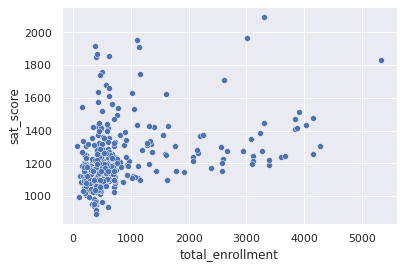

In [33]:
sns.set_theme()
_=sns.scatterplot(data=full,x='total_enrollment',y='sat_score')

There is a big cluster on the bottom left, with low total enrolment and low SAT scores.

Also, there seems to be a small positive correlation between SAT scores and total enrolment.

By making a list of schools, ordered by ascending SAT scores, this can be further explored.

In [34]:
#@title
display(full.sort_values(by='sat_score')['SCHOOL NAME'].head(10))

338                        MULTICULTURAL HIGH SCHOOL
301    INTERNATIONAL HIGH SCHOOL AT PROSPECT HEIGHTS
188            INTERNATIONAL SCHOOL FOR LIBERAL ARTS
240                    HIGH SCHOOL OF WORLD CULTURES
122              INTERNATIONAL COMMUNITY HIGH SCHOOL
170              ACADEMY FOR LANGUAGE AND TECHNOLOGY
378           PAN AMERICAN INTERNATIONAL HIGH SCHOOL
185            KINGSBRIDGE INTERNATIONAL HIGH SCHOOL
317                       IT TAKES A VILLAGE ACADEMY
171                  BRONX INTERNATIONAL HIGH SCHOOL
Name: SCHOOL NAME, dtype: object

After a quick web search, it is found that most of these schools are for students who are learning English. This seems to indicate that it is not total enrolment that is correlated with SAT scores, but rather the fact that students are English language learners.

## SAT score vs English language learners percentage
To elucidate whether the previous conjecture is true, a scatter plot of SAT scores vs English language learners percentage (`ell_percent`) is made.

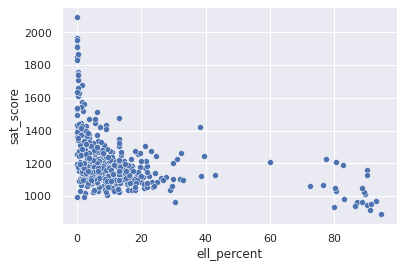

In [35]:
_=sns.scatterplot(data=full,x='ell_percent',y='sat_score')

There is a cluster with high `ell_percent` and low SAT scores on the bottom right of the plot.

By plotting the English language learners percentage by district, it can be compared to the previous map of SAT scores by district.

In [36]:
show_district_map('ell_percent')

As seen from both maps, districts with a high percentage of ELL tend to have lower SAT scores.

## SAT scores vs survey scores
Intuitively, a strong correlation can be expected between survey scores and SAT scores. To check if this is true, the correlation between these variables can be plotted.

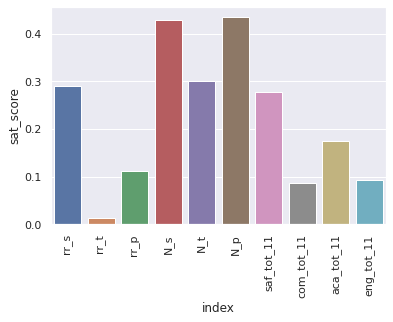

In [37]:
_=sns.barplot(
    x='index',
    y='sat_score',
    data=full.corr()['sat_score'][['rr_s', 'rr_t', 'rr_p', 'N_s', 'N_t', 'N_p', 'saf_tot_11', 'com_tot_11', 'aca_tot_11', 'eng_tot_11']].reset_index()
    )
_=plt.xticks(rotation=90)

Unexpectedly, the variables with the highest correlation are `N_s`, `N_t`, and `N_p` (the number of student, teacher, and parent respondents, respectively). The three of them correlate strongly with total enrolment, so they are likely biased by `ell_learners`.

The next metric that correlates most is `rr_s`, the response rate of students. Which makes sense, as a more engaged student corpus is more likely to answer the survey and more likely to do better on tests.

Next, `saf_tot_11` correlates most, the safety and respect total score. This also makes sense, as a safer environment makes learning easier for students.

But none of the other metrics correlates substantially with SAT scores. This might indicate that there is some kind of problem with the questions being asked.

## Race and SAT scores
Another angle to explore involves the relation of race to SAT scores. There was a significant difference between SAT scores across different races, which can be clearly seen by plotting them.

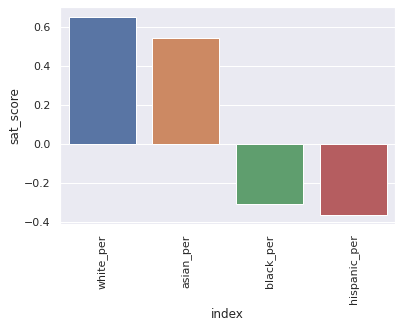

In [38]:
_=sns.barplot(
    x='index',
    y='sat_score',
    data=full.corr()['sat_score'][['white_per', 'asian_per', 'black_per', 'hispanic_per']].reset_index()
    )
_=plt.xticks(rotation=90)

Apparently, higher percentages of White and Asian students correlate with higher SAT scores, and higher percentages of Black and Hispanic students correlates with lower SAT scores.

It can be hypothesised that, for Hispanic students, this is caused because they are more recent immigrants, so they are English language learners.

A Hispanic percentage by district map can help shed some light on this.

In [39]:
show_district_map('hispanic_per')

There seems to be a correlation between Hispanic students percentage and English language learners, but the topic needs to be analysed further.

## Gender vs SAT scores
Finally, the correlation between gender and SAT scores will be explored. It was noticed that a higher percentage of female students correlates positively with SAT scores. This can be visualised with a bar plot.

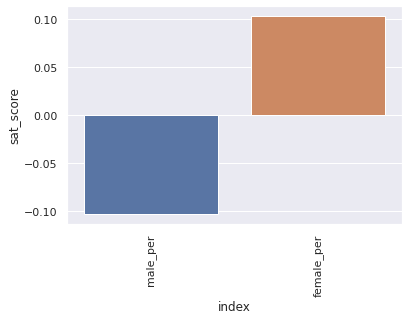

In [40]:
_=sns.barplot(
    x='index',
    y='sat_score',
    data=full.corr()['sat_score'][['male_per', 'female_per']].reset_index()
    )
_=plt.xticks(rotation=90)

To further analyse this correlation, a scatter plot can be made.

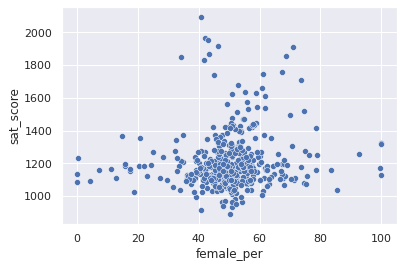

In [41]:
_=sns.scatterplot(data=full,x='female_per', y='sat_score')

In the extreme left and right sides of the plot are located the gender-segregated schools (male and female, respectively).

Also, there is a cluster with a high percentage of females (greater than 65 %) and very high SAT scores. To try to understand the nature of this cluster, a list of these schools can be printed.

In [42]:
display(full[(full['female_per'] > 65) & (full['sat_score'] > 1400)].sort_values(by='SCHOOL NAME')['SCHOOL NAME'])

8                         BARD HIGH SCHOOL EARLY COLLEGE
33                         ELEANOR ROOSEVELT HIGH SCHOOL
84     FIORELLO H. LAGUARDIA HIGH SCHOOL OF MUSIC & A...
445         FRANK SINATRA SCHOOL OF THE ARTS HIGH SCHOOL
28              PROFESSIONAL PERFORMING ARTS HIGH SCHOOL
51                          TALENT UNLIMITED HIGH SCHOOL
397                          TOWNSEND HARRIS HIGH SCHOOL
Name: SCHOOL NAME, dtype: object

A web search reveals that these are exclusive schools, centred on the performing arts. These schools tend to have a higher percentage of females, and higher SAT scores.

## AP scores
Now that the demographic angle has been analysed, a final relationship will be explored, the one between the proportion of students taking the AP exam and SAT scores. It can be expected that the correlation between these metrics is high, as students who take advanced courses tend to perform better on tests.

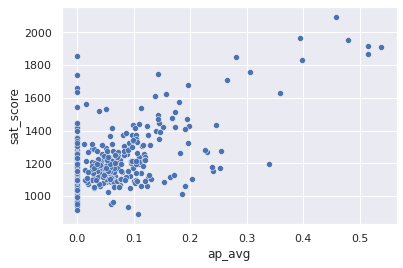

In [43]:
# Compute proportion of AP test-takers
full['ap_avg'] = full['AP Test Takers '] / full['total_enrollment']
_=sns.scatterplot(data=full,x='ap_avg', y='sat_score')

The plot shows that there seems to be a strong positive correlation between the two variables.

In the top right of the plot, there is a cluster with very high SAT scores and AP exam takers proportion. A list of these schools can be printed to examine them.

In [44]:
display(full[(full['ap_avg'] > .3) & (full['sat_score'] > 1700)].sort_values(by='SCHOOL NAME')['SCHOOL NAME'])

199                         BRONX HIGH SCHOOL OF SCIENCE
250                       BROOKLYN TECHNICAL HIGH SCHOOL
33                         ELEANOR ROOSEVELT HIGH SCHOOL
207    HIGH SCHOOL OF AMERICAN STUDIES AT LEHMAN COLLEGE
428    QUEENS HIGH SCHOOL FOR THE SCIENCES AT YORK CO...
460                  STATEN ISLAND TECHNICAL HIGH SCHOOL
48                                STUYVESANT HIGH SCHOOL
397                          TOWNSEND HARRIS HIGH SCHOOL
Name: SCHOOL NAME, dtype: object

These seem to be [highly selective schools](https://en.wikipedia.org/wiki/Magnet_school), which require a test to get in, so it makes sense that they have a high proportion of AP test-takers.

# Bringing the story to an end
In this notebook, a basic data science analysis was performed, bringing together different datasets, and going through the whole process workflow.

Several computations and visualisations were made to try to better understand the data. As a highlight, maps were used to help set up the context of the analysis.

This was a first approach to data science, done following a tutorial, and it should serve as a basis to perform a more custom-made project.